# Credit Card Users Churn Prediction

## Problem Statement

### Business Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

### Data Description

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank (in months)
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

#### What Is a Revolving Balance?

- If we don't pay the balance of the revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance


##### What is the Average Open to buy?

- 'Open to Buy' means the amount left on your credit card to use. Now, this column represents the average of this value for the last 12 months.

##### What is the Average utilization Ratio?

- The Avg_Utilization_Ratio represents how much of the available credit the customer spent. This is useful for calculating credit scores.


##### Relation b/w Avg_Open_To_Buy, Credit_Limit and Avg_Utilization_Ratio:

- ( Avg_Open_To_Buy / Credit_Limit ) + Avg_Utilization_Ratio = 1

### **Please read the instructions carefully before starting the project.**
This is a commented Jupyter IPython Notebook file in which all the instructions and tasks to be performed are mentioned.
* Blanks '_______' are provided in the notebook that
needs to be filled with an appropriate code to get the correct result. With every '_______' blank, there is a comment that briefly describes what needs to be filled in the blank space.
* Identify the task to be performed correctly, and only then proceed to write the required code.
* Fill the code wherever asked by the commented lines like "# write your code here" or "# complete the code". Running incomplete code may throw error.
* Please run the codes in a sequential manner from the beginning to avoid any unnecessary errors.
* Add the results/observations (wherever mentioned) derived from the analysis in the presentation and submit the same.


## Importing necessary libraries

In [2]:
# Installing the libraries with the specified version.
# uncomment and run the following line if Google Colab is being used
# !pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 imbalanced-learn==0.10.1 xgboost==2.0.3 -q --user
!python -m pip install scikit-learn seaborn matplotlib numpy pandas imbalanced-learn xgboost 

In [3]:
# Installing the libraries with the specified version.
# uncomment and run the following lines if Jupyter Notebook is being used
# !pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 imblearn==0.12.0 xgboost==2.0.3 -q --user
# !pip install --upgrade -q threadpoolctl
!python -m pip install --upgrade -q threadpoolctl

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again*.

In [17]:
!python -m pip install lightgbm tabulate

  Using cached tabulate-0.9.0-py3-none-any.whl.metadata (34 kB)
Using cached tabulate-0.9.0-py3-none-any.whl (35 kB)


## There are lots of library comaptibility issues, so avoided using original versions defined in this notebook
## instead chose to keep installed working versions of libraries

In [154]:
# Import required libraries
import warnings

warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
from datetime import datetime

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.impute import SimpleImputer
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.base import TransformerMixin

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from sklearn.dummy import DummyClassifier
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (f1_score,
                             accuracy_score,
                             recall_score,
                             precision_score,
                             confusion_matrix,
                             roc_auc_score,                             
                            # plot_confusion_matrix,
                            ConfusionMatrixDisplay,
                             #plot_roc_curve,
                             RocCurveDisplay
                             )

from sklearn.preprocessing import (StandardScaler,
                                   MinMaxScaler,
                                   OneHotEncoder,
                                   RobustScaler,
                                   )

from xgboost import XGBClassifier



from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
import lightgbm as lgb
from tabulate import tabulate


## Loading the dataset

In [19]:
# Loading the dataset
data_original = pd.read_csv("BankChurners.csv")
# make a back up copy if things go wrong
data = data_original.copy()

## Data Overview

- Observations
- Sanity checks

In [21]:
# Check shape of data 
data.shape

(10127, 21)

In [22]:
# Display the first 5 rows of the dataset
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [23]:
# Display last 5 rows of the dataset
data.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,...,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,...,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,...,2,4,10388.0,1961,8427.0,0.703,10294,61,0.649,0.189


In [24]:
# List data types
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [25]:
# Check Duplicate data
data.duplicated().sum()

0

## No duplicate data found

## Data Pre-processing

In [26]:
# Check for missing or null values
data.isnull().sum()


CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

## Missing value imputation




In [27]:
# Impute missing Education Level values with the most frequent category (mode) if the variable is ordinal.
# Calculate the mode of the ordinal variable
mode_value = data['Education_Level'].mode()[0]  # The mode() method returns a Series; we take the first value

# Replace missing values with the mode
data['Education_Level'].fillna(mode_value, inplace=True)

# Display the Duplicate count for Education_Level after imputation
data.isnull().sum()

CLIENTNUM                     0
Attrition_Flag                0
Customer_Age                  0
Gender                        0
Dependent_count               0
Education_Level               0
Marital_Status              749
Income_Category               0
Card_Category                 0
Months_on_book                0
Total_Relationship_Count      0
Months_Inactive_12_mon        0
Contacts_Count_12_mon         0
Credit_Limit                  0
Total_Revolving_Bal           0
Avg_Open_To_Buy               0
Total_Amt_Chng_Q4_Q1          0
Total_Trans_Amt               0
Total_Trans_Ct                0
Total_Ct_Chng_Q4_Q1           0
Avg_Utilization_Ratio         0
dtype: int64

In [30]:
# For Marital_Status will use Group-wise Imputation Based on Customer_Age and Income_Category with the mode within groups 
# (e.g., grouped by Income_Category and Customer_Age ranges)
# Step 1: Group-wise mode imputation based on Customer_Age and Income_Category
data['Marital_Status'] = data['Marital_Status'].fillna(
    data.groupby(['Customer_Age', 'Income_Category'])['Marital_Status'].transform(lambda x: x.mode()[0] if not x.mode().empty else np.nan)
)
# Step 2: Impute remaining null values with the overall mode
overall_mode = data['Marital_Status'].mode()[0]
data['Marital_Status'].fillna(overall_mode, inplace=True)
# Display the Duplicate count for Marital_Status after imputation
data.isnull().sum()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [40]:
# Check unique values in Income_Category
print(data['Income_Category'].unique())

['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'abc']


In [41]:
# Replace abc with Unknown in Income_Category
data.loc[data[data["Income_Category"] == "abc"].index, "Income_Category"] = "Unknown"

In [32]:
# Describe the dataset
# supress scientific notations for data
pd.set_option("display.float_format", lambda x: "%.3f" % x)
data.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.000,739177606.334,36903783.450,708082083.000,713036770.500,717926358.000,773143533.000,828343083.000
Customer_Age,10127.000,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Dependent_count,10127.000,2.346,1.299,0.000,1.000,2.000,3.000,5.000
Months_on_book,10127.000,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.000,3.813,1.554,1.000,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.000,2.341,1.011,0.000,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.000,2.455,1.106,0.000,2.000,2.000,3.000,6.000
Credit_Limit,10127.000,8631.954,9088.777,1438.300,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.000,1162.814,814.987,0.000,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.000,7469.140,9090.685,3.000,1324.500,3474.000,9859.000,34516.000


## Observation
- Mean value for the Customer Age column is 46..326 and the median is also approximately 46. This shows that majority of the customers are under 46 years of age.
- Dependent Count column has mean and median around 2.
- Months on Book column has mean and median of 35.928 months. Minimum value is 13 months, Max value is 56 months, it shows that data for customers with the bank at least one year.
- Total Relationship Count has mean and median of around 4.
- Credit Limit has a wide range of 1.4K to 34.5K, the median being 4.5K, much lower than the mean 8.6K
- Total Transaction Amount has mean of 4.4K and median of 3.8
- Total Transaction Count has mean of 64.85 and median of 67- 

In [33]:
# Check for unique values in the dataset to having numberic type
data.select_dtypes(exclude="object").nunique()

CLIENTNUM                   10127
Customer_Age                   45
Dependent_count                 6
Months_on_book                 44
Total_Relationship_Count        6
Months_Inactive_12_mon          7
Contacts_Count_12_mon           7
Credit_Limit                 6205
Total_Revolving_Bal          1974
Avg_Open_To_Buy              6813
Total_Amt_Chng_Q4_Q1         1158
Total_Trans_Amt              5033
Total_Trans_Ct                126
Total_Ct_Chng_Q4_Q1           830
Avg_Utilization_Ratio         964
dtype: int64

In [34]:
# Check for unique values in the dataset to having categorical variables
data.select_dtypes(include="object").nunique()

Attrition_Flag     2
Gender             2
Education_Level    6
Marital_Status     3
Income_Category    6
Card_Category      4
dtype: int64

In [35]:
# Check statistical summary of the categorical columns
data.describe(include="object").T

,count,unique,top,freq
Attrition_Flag,10127,2,Existing Customer,8500
Gender,10127,2,F,5358
Education_Level,10127,6,Graduate,4647
Marital_Status,10127,3,Married,5292
Income_Category,10127,6,Less than $40K,3561
Card_Category,10127,4,Blue,9436


In [36]:
# print unique value counts and percentages for columns of type object (categorical variables)
# Select only object (categorical) columns
categorical_columns = data.select_dtypes(include=['object']).columns

# Print unique value counts and percentages for each categorical variable
for col in categorical_columns:
    print(f"Column: {col}")
    value_counts = data[col].value_counts()
    percentages = data[col].value_counts(normalize=True) * 100
    print(pd.DataFrame({'Count': value_counts, 'Percentage (%)': percentages}))
    print("\n" + "-" * 40 + "\n")

Column: Attrition_Flag
                   Count  Percentage (%)
Existing Customer   8500          83.934
Attrited Customer   1627          16.066

----------------------------------------

Column: Gender
   Count  Percentage (%)
F   5358          52.908
M   4769          47.092

----------------------------------------

Column: Education_Level
               Count  Percentage (%)
Graduate        4647          45.887
High School     2013          19.878
Uneducated      1487          14.684
College         1013          10.003
Post-Graduate    516           5.095
Doctorate        451           4.453

----------------------------------------

Column: Marital_Status
          Count  Percentage (%)
Married    5292          52.256
Single     4087          40.357
Divorced    748           7.386

----------------------------------------

Column: Income_Category
                Count  Percentage (%)
Less than $40K   3561          35.163
$40K - $60K      1790          17.676
$80K - $120K     153

In [42]:
# Convert the categorical columns to category data type
category_columns = data.select_dtypes(include="object").columns.tolist()
data[categorical_columns] = data[categorical_columns].astype("category")

In [43]:
# Make all column names uniform by replacing spaces with _ and lowercasing all characters
data.columns = [i.replace(" ", "_").lower() for i in data.columns]

In [44]:
# Show Data types
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   attrition_flag            10127 non-null  category
 1   customer_age              10127 non-null  int64   
 2   gender                    10127 non-null  category
 3   dependent_count           10127 non-null  int64   
 4   education_level           10127 non-null  category
 5   marital_status            10127 non-null  category
 6   income_category           10127 non-null  category
 7   card_category             10127 non-null  category
 8   months_on_book            10127 non-null  int64   
 9   total_relationship_count  10127 non-null  int64   
 10  months_inactive_12_mon    10127 non-null  int64   
 11  contacts_count_12_mon     10127 non-null  int64   
 12  credit_limit              10127 non-null  float64 
 13  total_revolving_bal       10127 non-null  int6

### Data Type is in proper catagory or numeric type for further Analysis 
### Data and column names looks more consistent now.

In [37]:
# Drop CLEINTCLIENTNUM_NUM column
data.drop(columns=["CLIENTNUM"], inplace=True)

## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions**:

1. How is the total transaction amount distributed?
2. What is the distribution of the level of education of customers?
3. What is the distribution of the level of income of customers?
4. How does the change in transaction amount between Q4 and Q1 (`total_ct_change_Q4_Q1`) vary by the customer's account status (`Attrition_Flag`)?
5. How does the number of months a customer was inactive in the last 12 months (`Months_Inactive_12_mon`) vary by the customer's account status (`Attrition_Flag`)?
6. What are the attributes that have a strong correlation with each other?



#### The below functions need to be defined to carry out the Exploratory Data Analysis.

In [45]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [46]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [47]:
# function to plot stacked bar chart

def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

In [48]:
### Function to plot distributions

def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

## Univariate Analysis

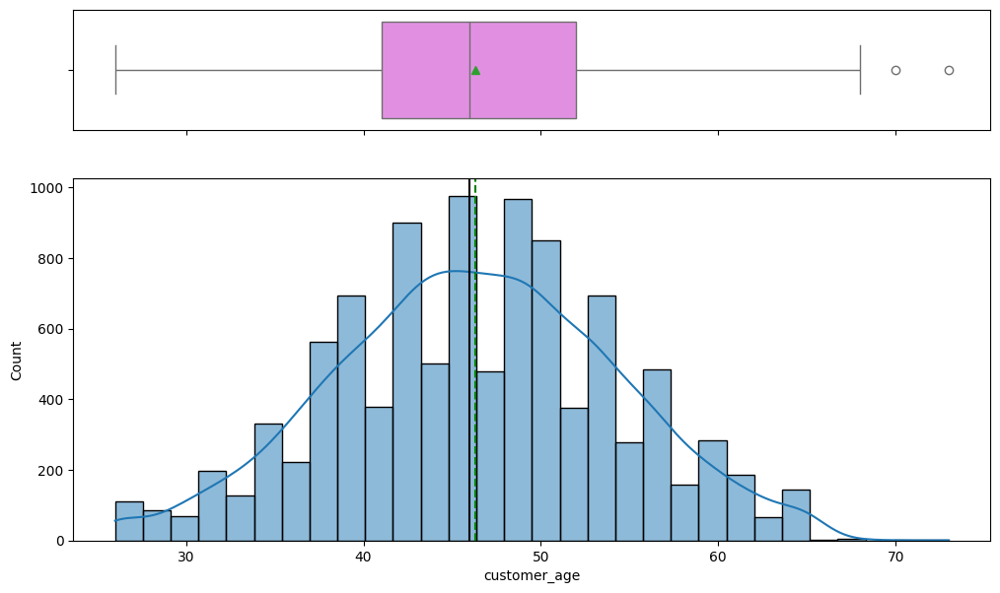

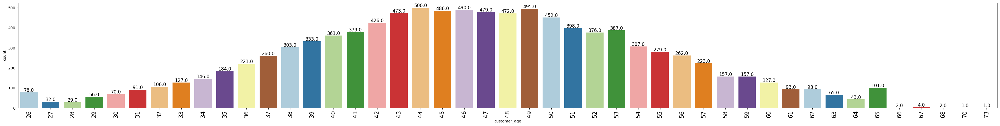

attrition_flag  Attrited Customer  Existing Customer    All
customer_age                                               
All                          1627               8500  10127
43                             85                388    473
48                             85                387    472
44                             84                416    500
46                             82                408    490
45                             79                407    486
49                             79                416    495
47                             76                403    479
41                             76                303    379
50                             71                381    452
54                             69                238    307
40                             64                297    361
42                             62                364    426
53                             59                328    387
52                             58       

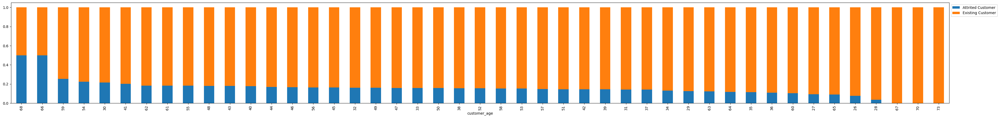

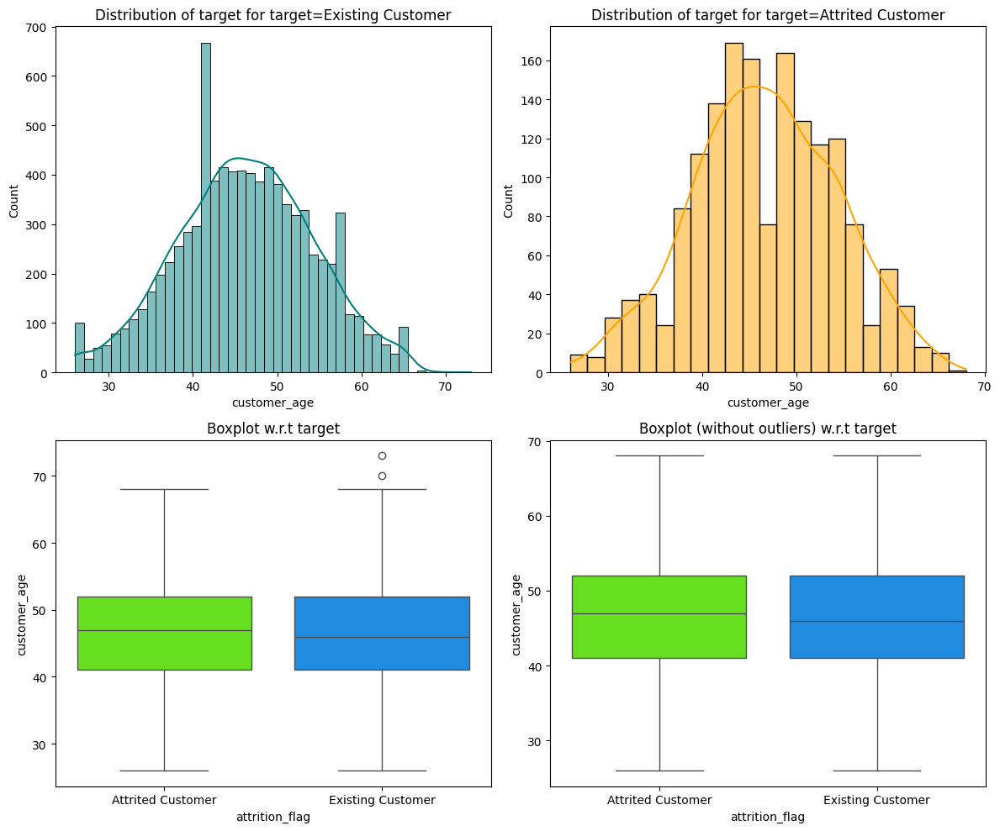

In [53]:
histogram_boxplot(data, "customer_age", figsize=(12, 7), kde=True, bins=30)
labeled_barplot(data, "customer_age")
stacked_barplot(data, "customer_age", "attrition_flag")
distribution_plot_wrt_target(data, "customer_age", "attrition_flag")

### The data is normally distributed, with only 2 outliers on the right side (higher end)

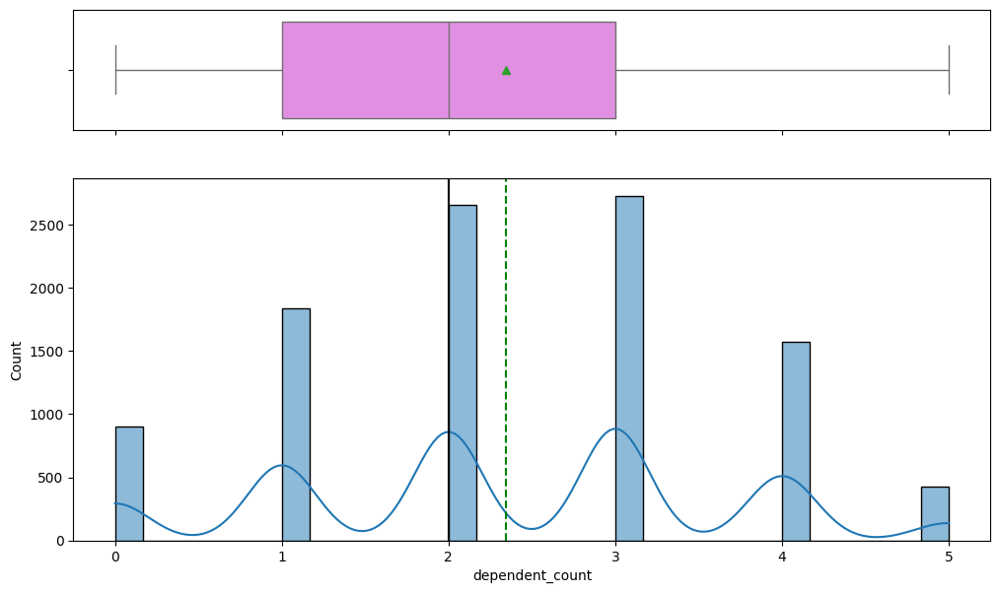

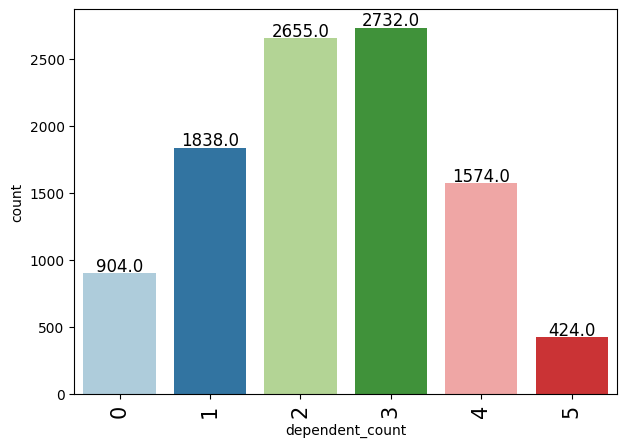

attrition_flag   Attrited Customer  Existing Customer    All
dependent_count                                             
All                           1627               8500  10127
3                              482               2250   2732
2                              417               2238   2655
1                              269               1569   1838
4                              260               1314   1574
0                              135                769    904
5                               64                360    424
------------------------------------------------------------------------------------------------------------------------


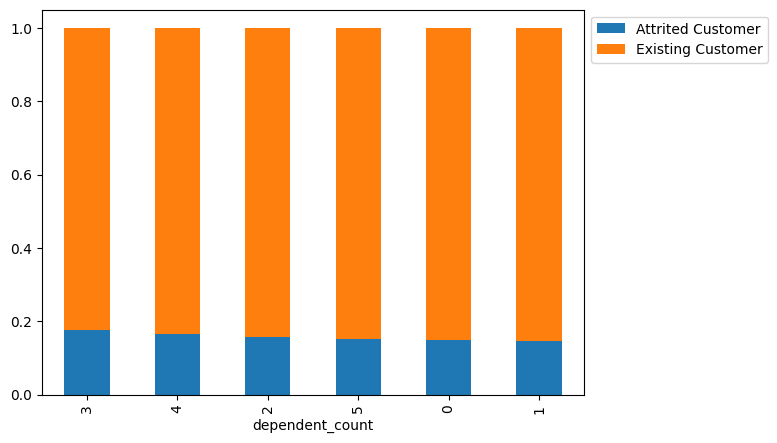

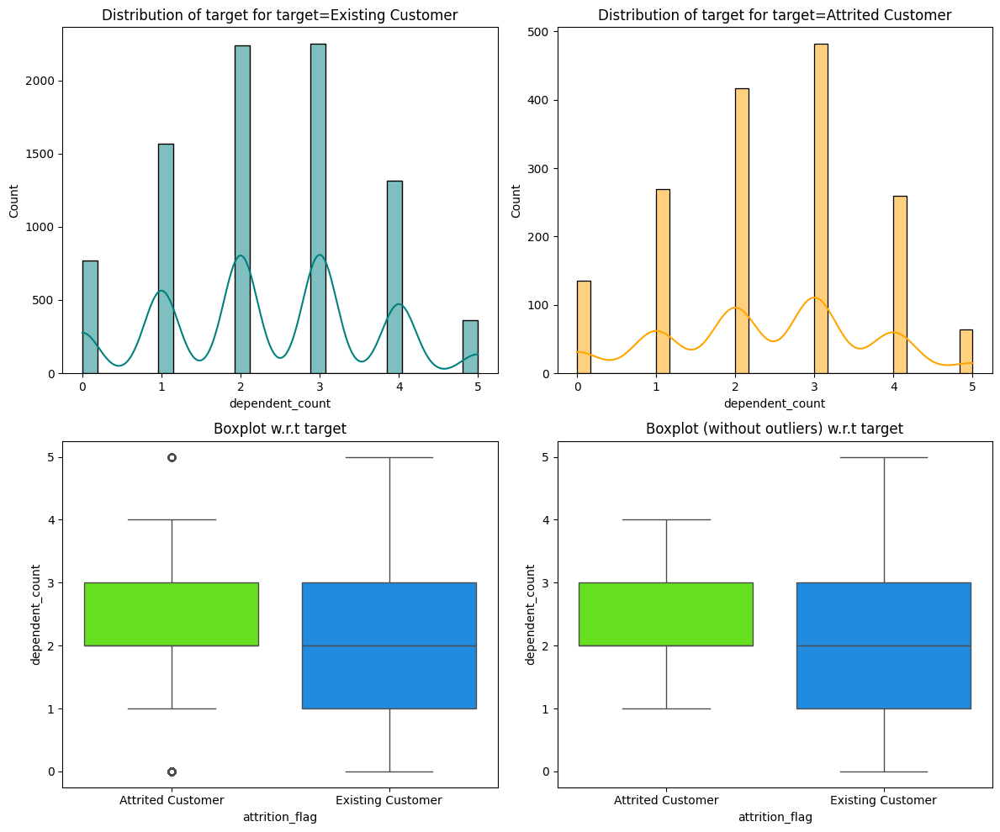

In [54]:
histogram_boxplot(data, "dependent_count", figsize=(12, 7), kde=True, bins=30)
labeled_barplot(data, "dependent_count")
stacked_barplot(data, "dependent_count", "attrition_flag")
distribution_plot_wrt_target(data, "dependent_count", "attrition_flag")

### Dependent Count is mostly 2 or 3

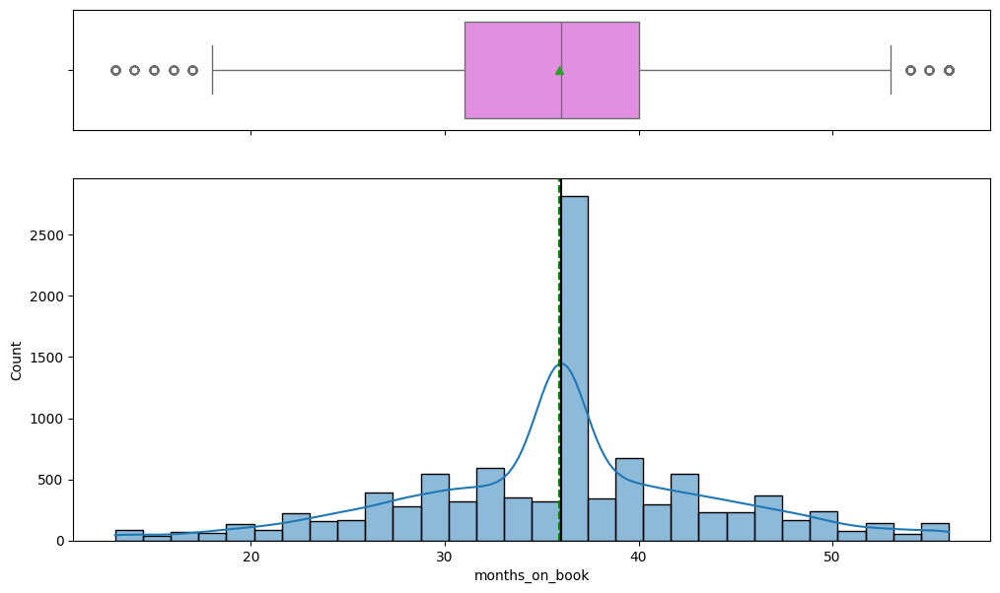

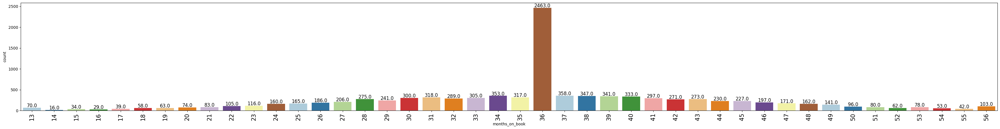

attrition_flag  Attrited Customer  Existing Customer    All
months_on_book                                             
All                          1627               8500  10127
36                            430               2033   2463
39                             64                277    341
37                             62                296    358
30                             58                242    300
38                             57                290    347
34                             57                296    353
41                             51                246    297
33                             48                257    305
40                             45                288    333
35                             45                272    317
32                             44                245    289
28                             43                232    275
44                             42                188    230
43                             42       

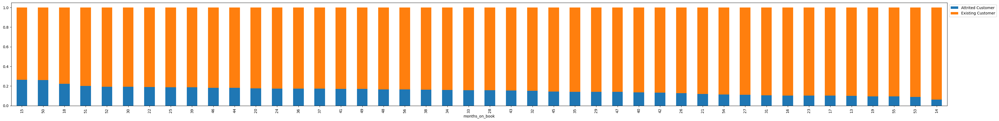

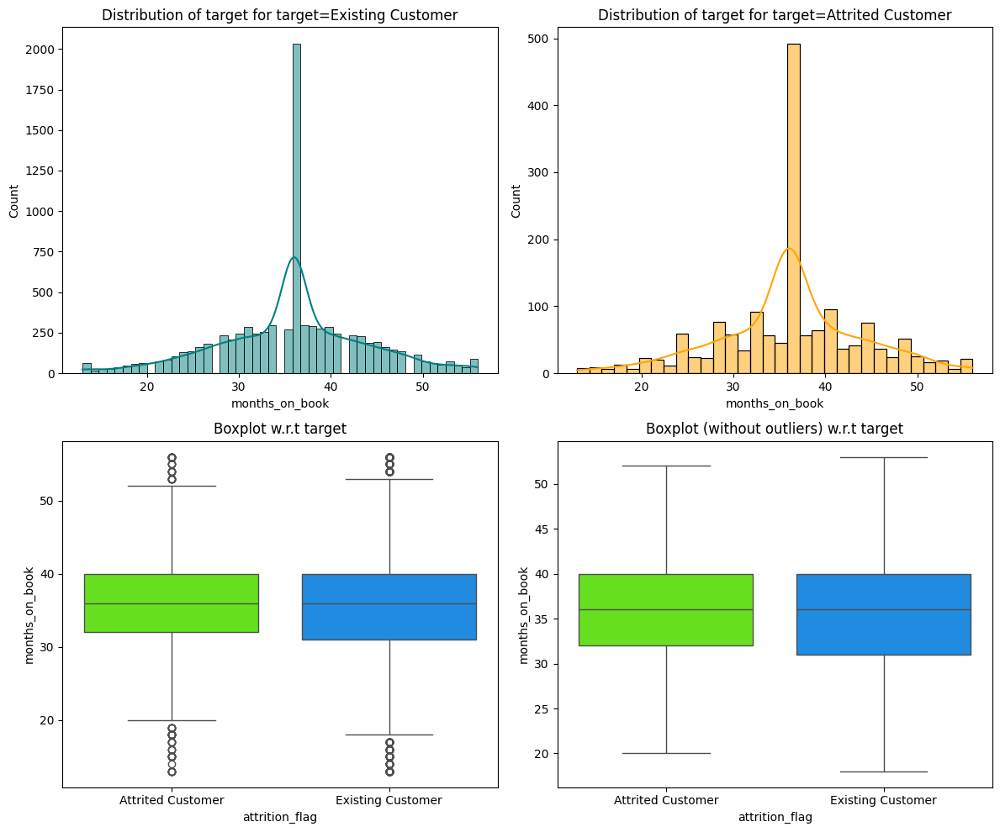

In [55]:
histogram_boxplot(data, "months_on_book", figsize=(12, 7), kde=True, bins=30)
labeled_barplot(data, "months_on_book")
stacked_barplot(data, "months_on_book", "attrition_flag")
distribution_plot_wrt_target(data, "months_on_book", "attrition_flag")

- There are outliers on both lower and higher end
- Most customers are on the books for 3 years

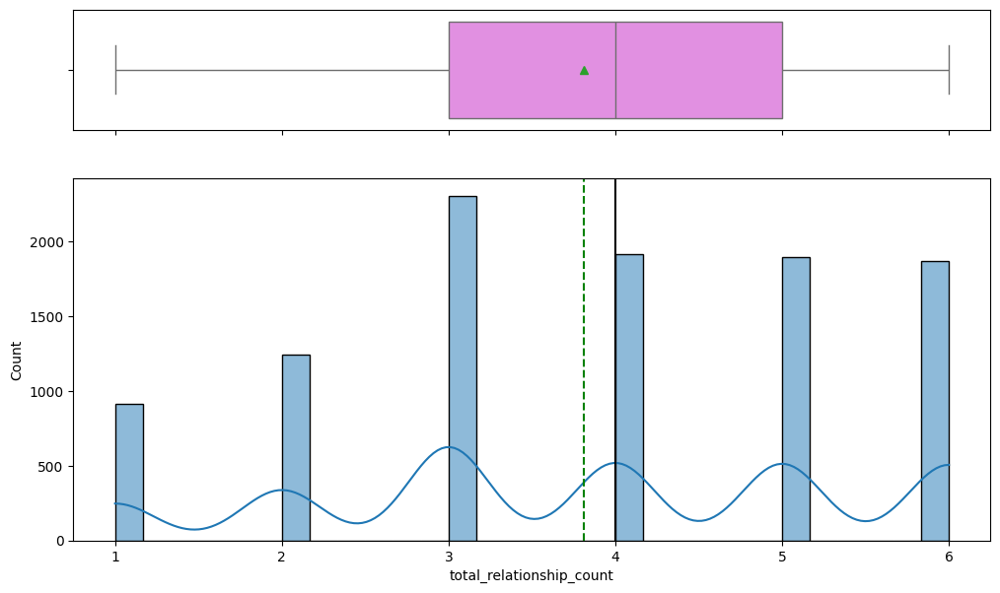

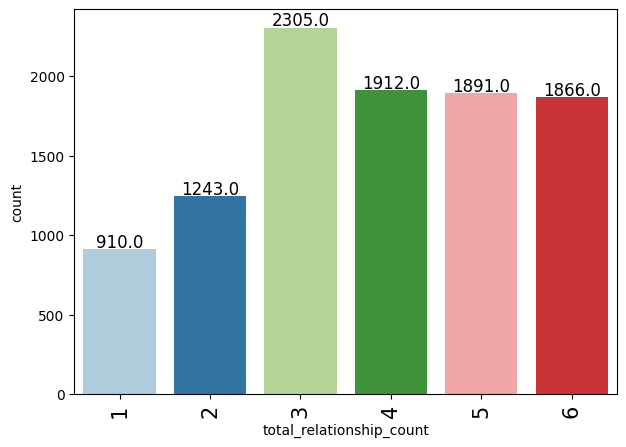

attrition_flag            Attrited Customer  Existing Customer    All
total_relationship_count                                             
All                                    1627               8500  10127
3                                       400               1905   2305
2                                       346                897   1243
1                                       233                677    910
5                                       227               1664   1891
4                                       225               1687   1912
6                                       196               1670   1866
------------------------------------------------------------------------------------------------------------------------


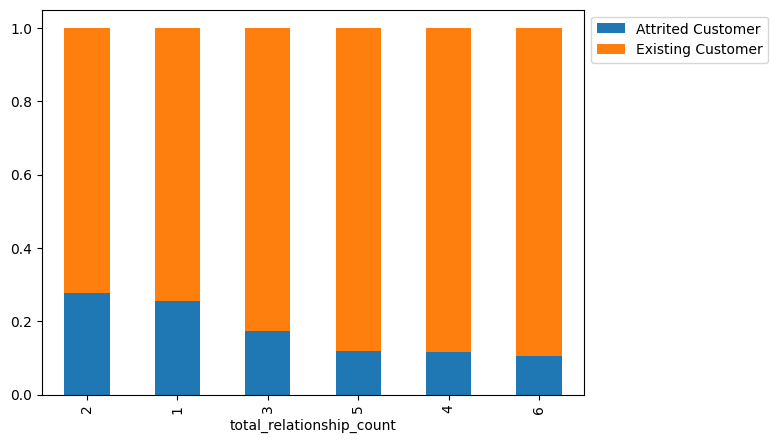

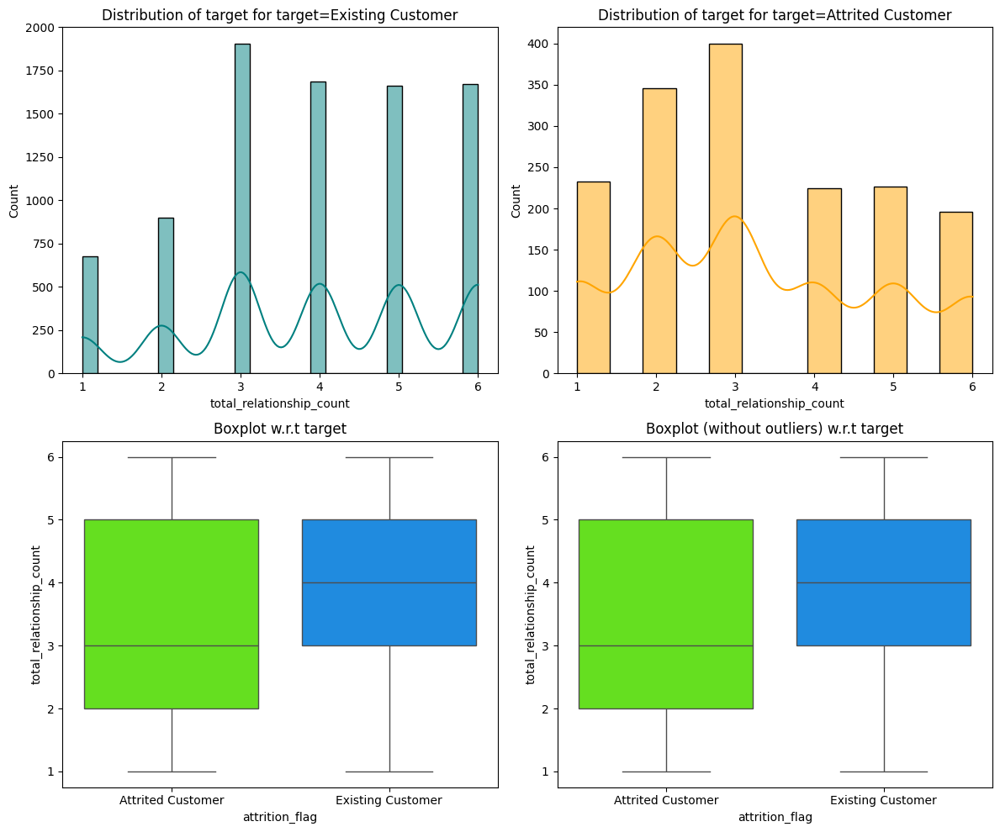

In [56]:
histogram_boxplot(data, "total_relationship_count", figsize=(12, 7), kde=True, bins=30)
labeled_barplot(data, "total_relationship_count")
stacked_barplot(data, "total_relationship_count", "attrition_flag")
distribution_plot_wrt_target(data, "total_relationship_count", "attrition_flag")

### Most of the customers have 4 or more relations with the bank

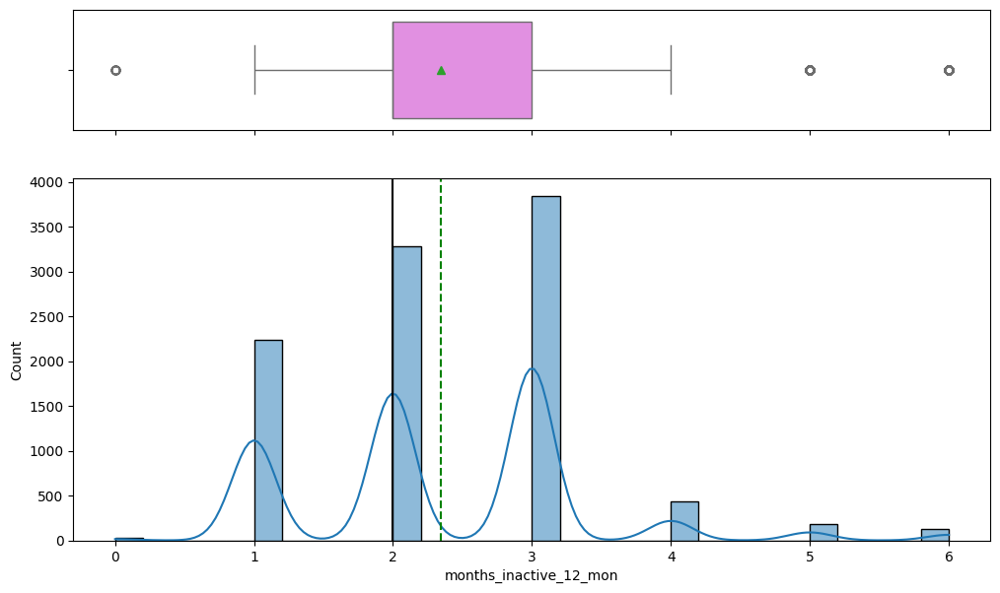

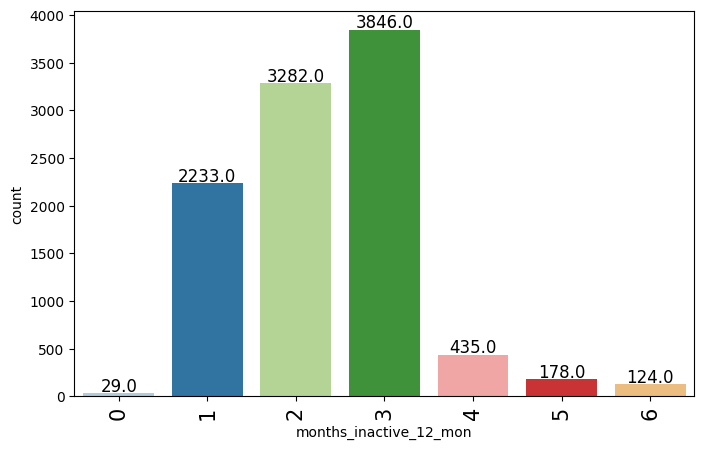

attrition_flag          Attrited Customer  Existing Customer    All
months_inactive_12_mon                                             
All                                  1627               8500  10127
3                                     826               3020   3846
2                                     505               2777   3282
4                                     130                305    435
1                                     100               2133   2233
5                                      32                146    178
6                                      19                105    124
0                                      15                 14     29
------------------------------------------------------------------------------------------------------------------------


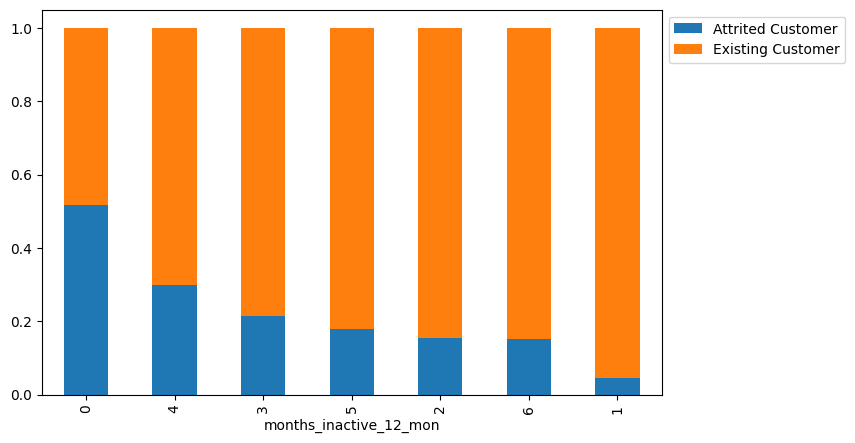

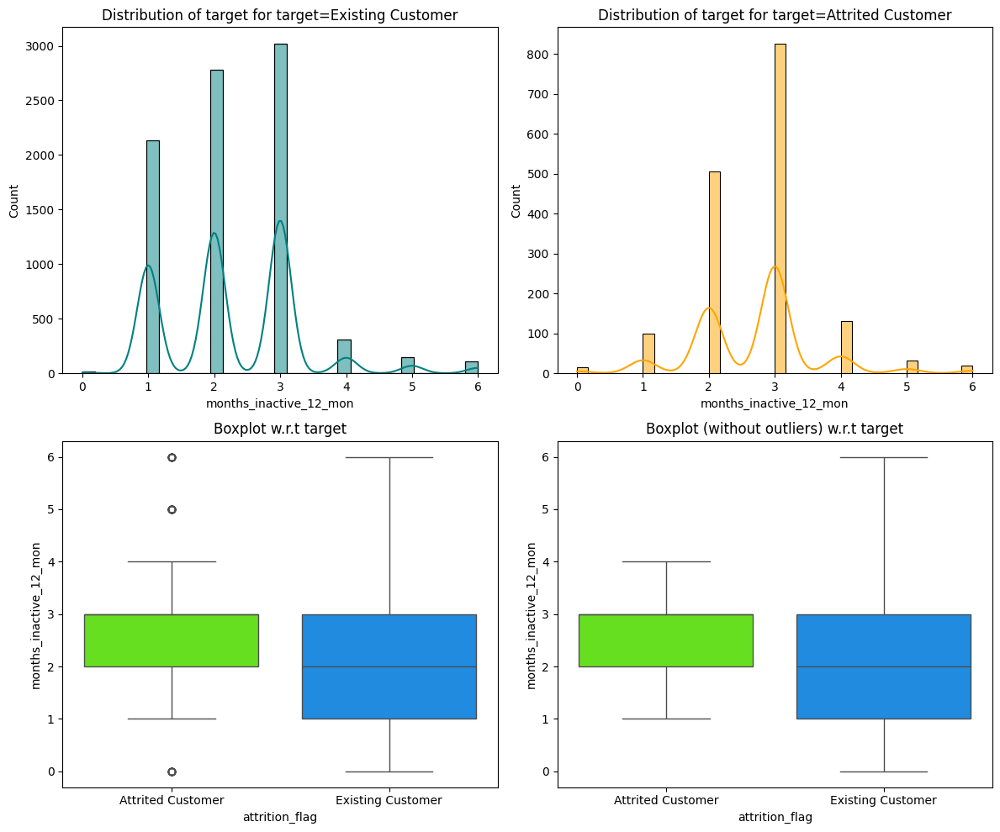

In [57]:
histogram_boxplot(data, "months_inactive_12_mon", figsize=(12, 7), kde=True, bins=30)
labeled_barplot(data, "months_inactive_12_mon")
stacked_barplot(data, "months_inactive_12_mon", "attrition_flag")
distribution_plot_wrt_target(data, "months_inactive_12_mon", "attrition_flag")

- There are lower and higher end outliers for Months inactive in last 12 months
- Lower end outliers are not concerning since 0 value means the customer is always active.
- The customers who are inactive for 5 or more months are to be concerned about.


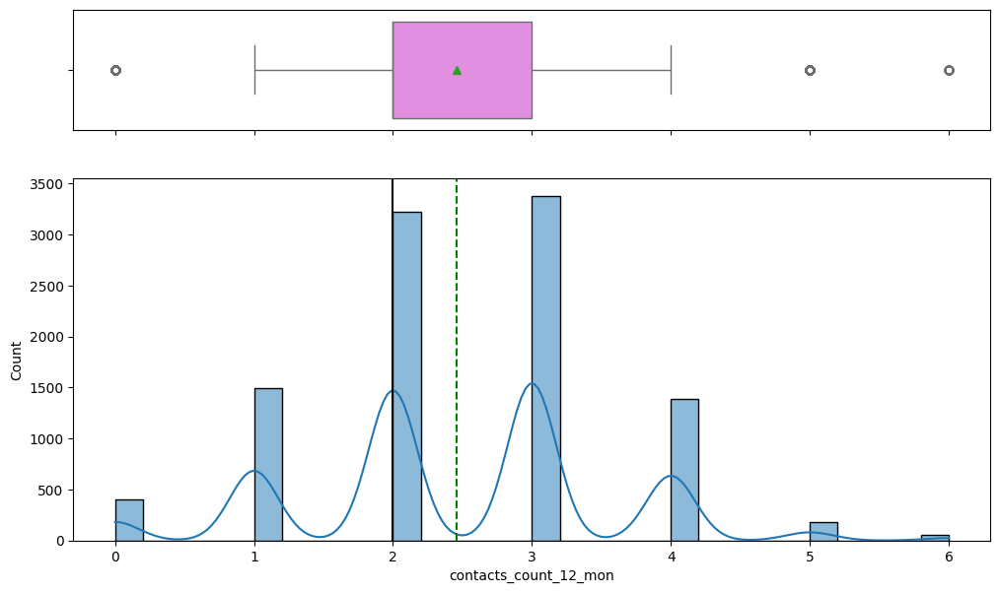

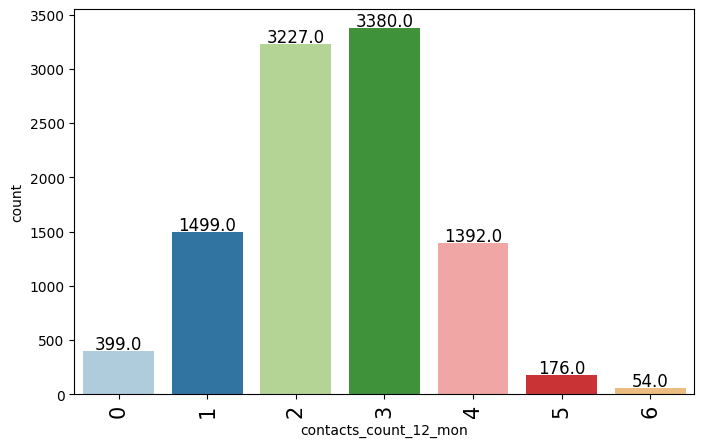

attrition_flag         Attrited Customer  Existing Customer    All
contacts_count_12_mon                                             
All                                 1627               8500  10127
3                                    681               2699   3380
2                                    403               2824   3227
4                                    315               1077   1392
1                                    108               1391   1499
5                                     59                117    176
6                                     54                  0     54
0                                      7                392    399
------------------------------------------------------------------------------------------------------------------------


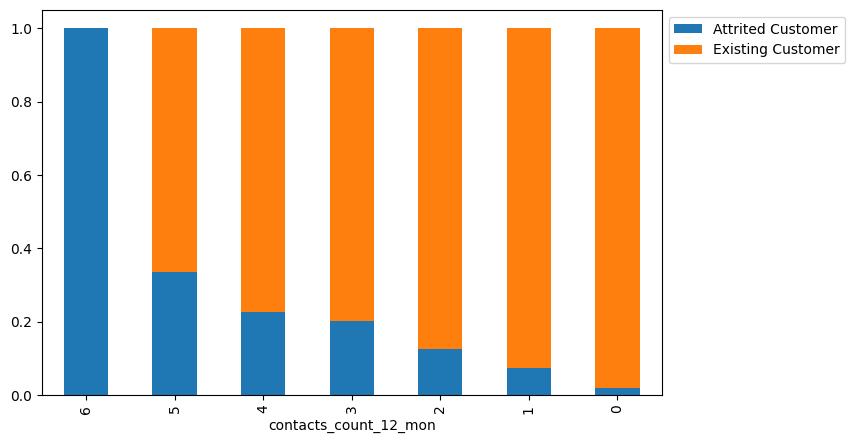

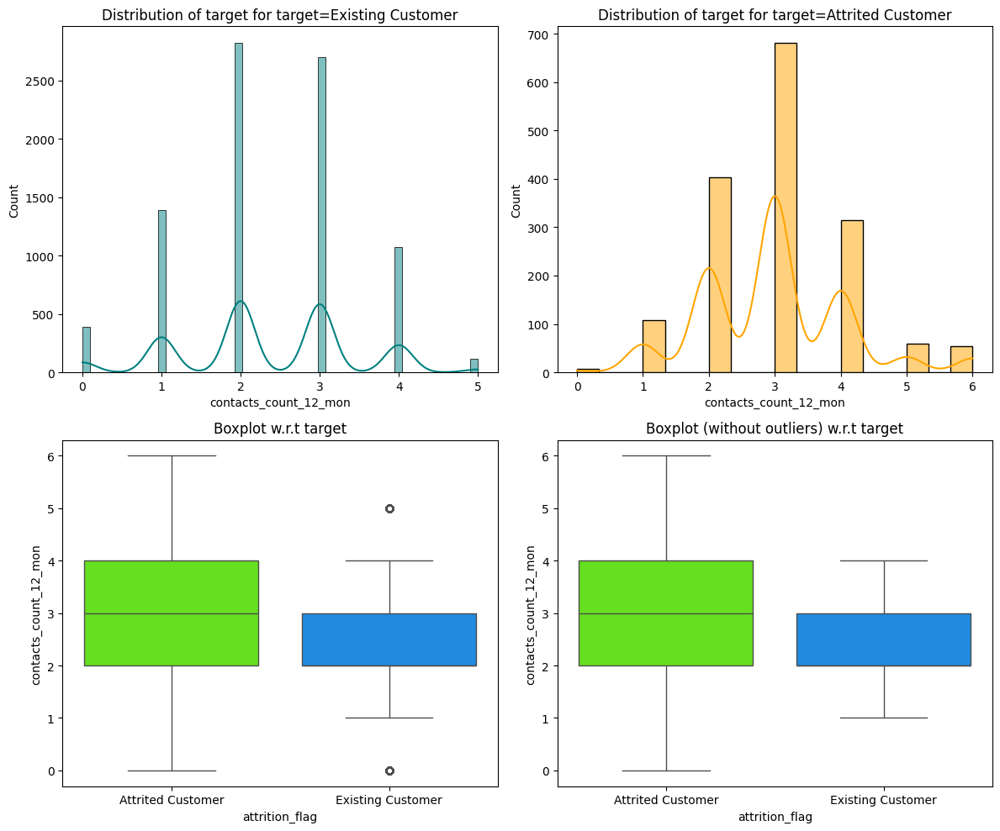

In [58]:
histogram_boxplot(data, "contacts_count_12_mon", figsize=(12, 7), kde=True, bins=30)
labeled_barplot(data, "contacts_count_12_mon")
stacked_barplot(data, "contacts_count_12_mon", "attrition_flag")
distribution_plot_wrt_target(data, "contacts_count_12_mon", "attrition_flag")

- Less number of contacts between the bank and the customer should important to check.
- Noticable lower and higher end outliers.

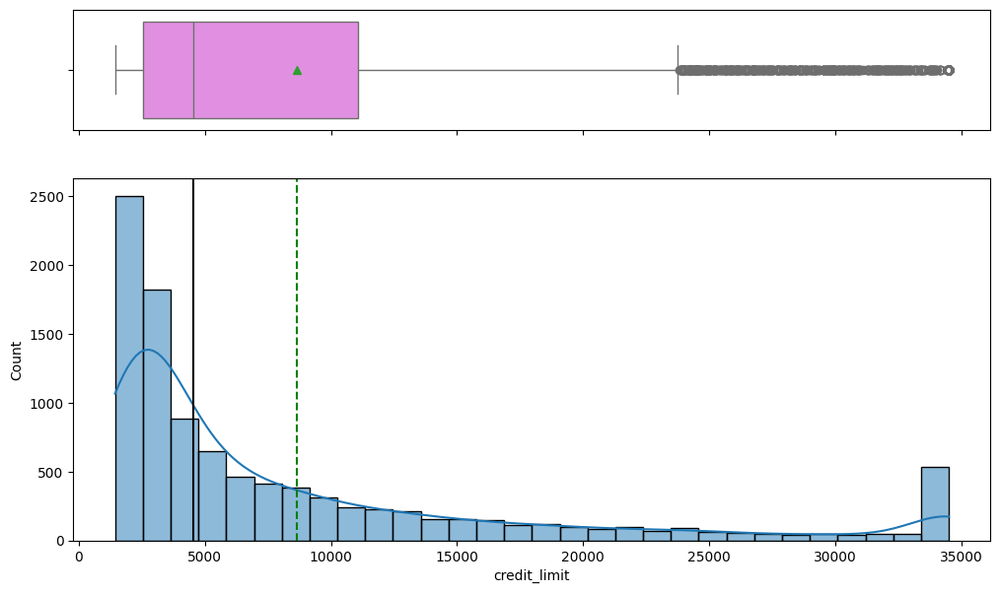

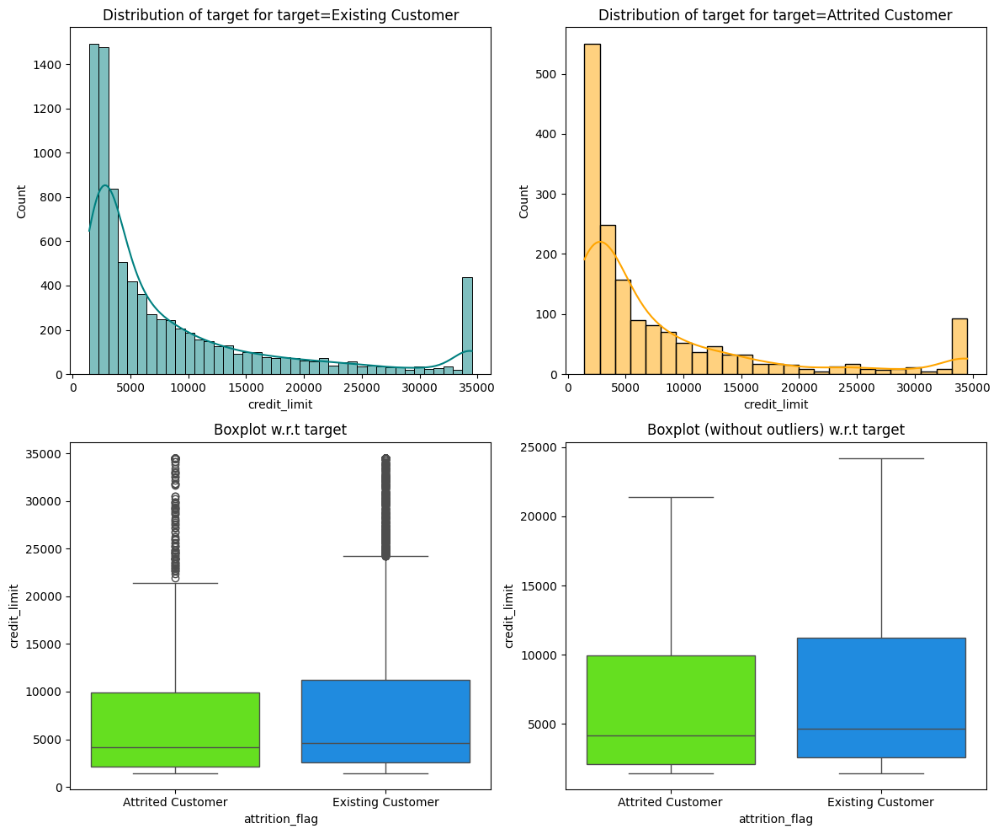

In [60]:
histogram_boxplot(data, "credit_limit", figsize=(12, 7), kde=True, bins=30)
# for bar plot you get ValueError: Image size of 620600x500 pixels is too large. It must be less than 2^16 in each direction.
# large lables are causing this issue as well as image size becomes too large for the plot, so ignore those two
#labeled_barplot(data, "credit_limit")
#stacked_barplot(data, "credit_limit", "attrition_flag")
distribution_plot_wrt_target(data, "credit_limit", "attrition_flag")

### Due to high end customers, there are higher end outliers in Credit Limit.

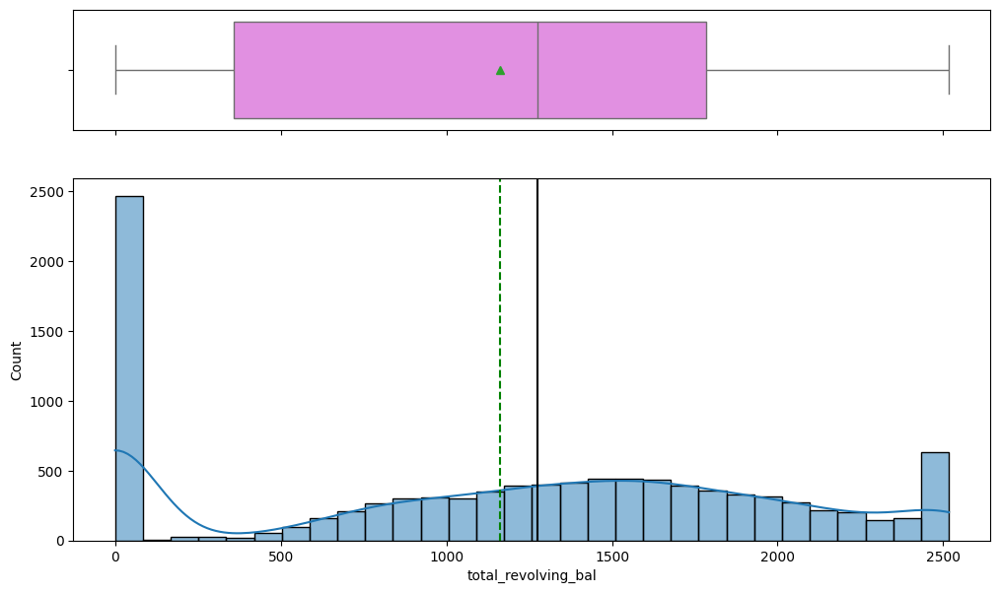

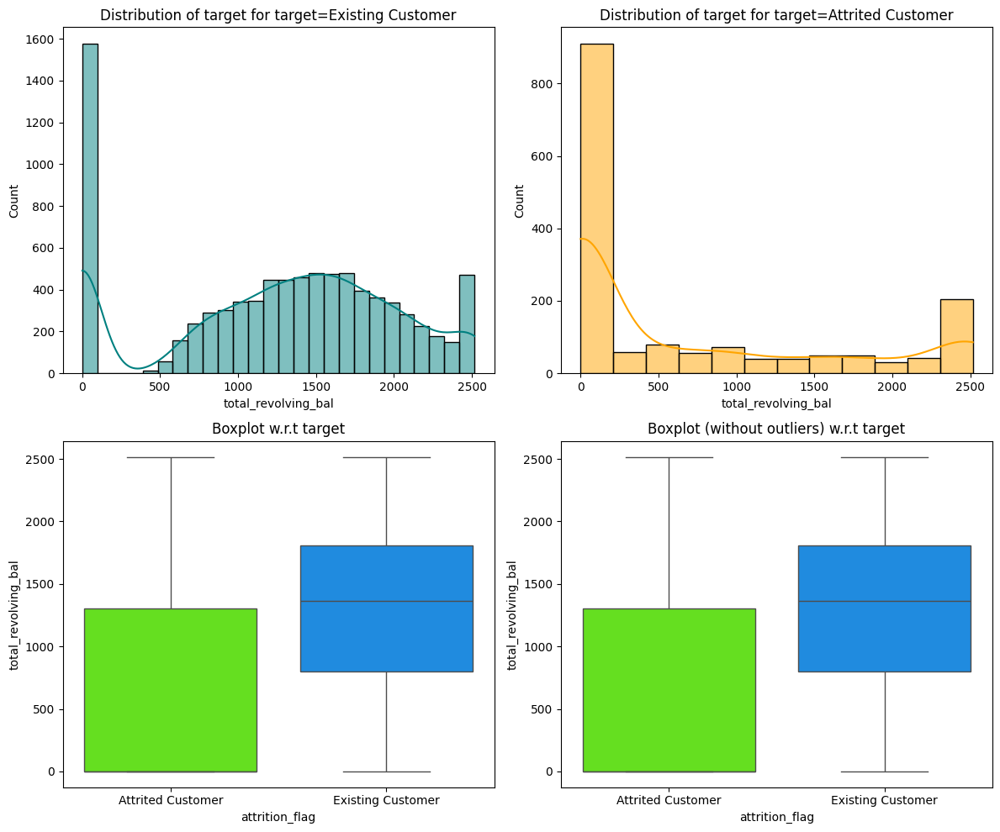

In [63]:
histogram_boxplot(data, "total_revolving_bal", figsize=(12, 7), kde=True, bins=30)
distribution_plot_wrt_target(data, "total_revolving_bal", "attrition_flag")

### Total revolving balance of 0 would mean the customer never uses the credit card, that is concerning.

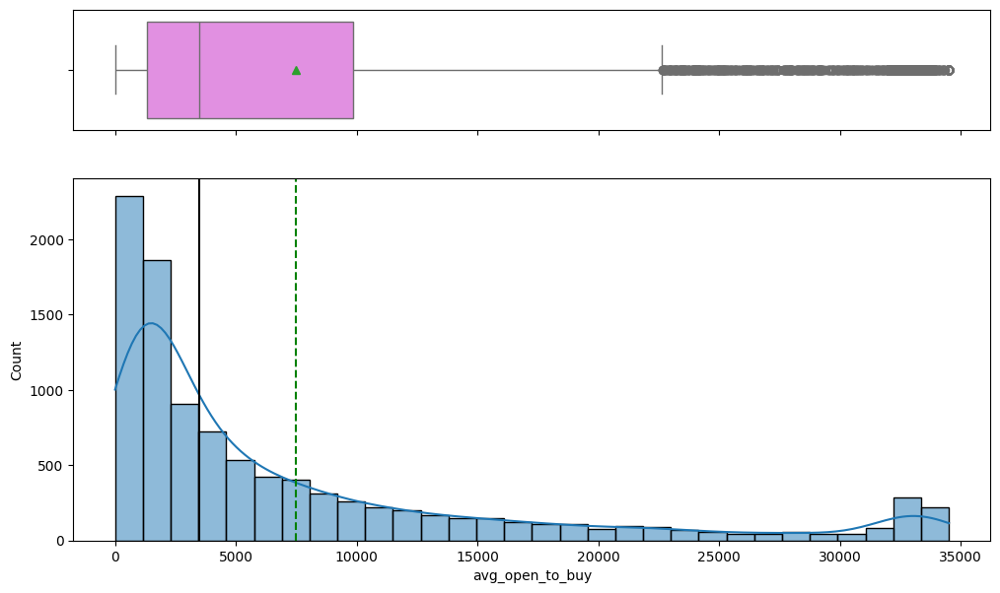

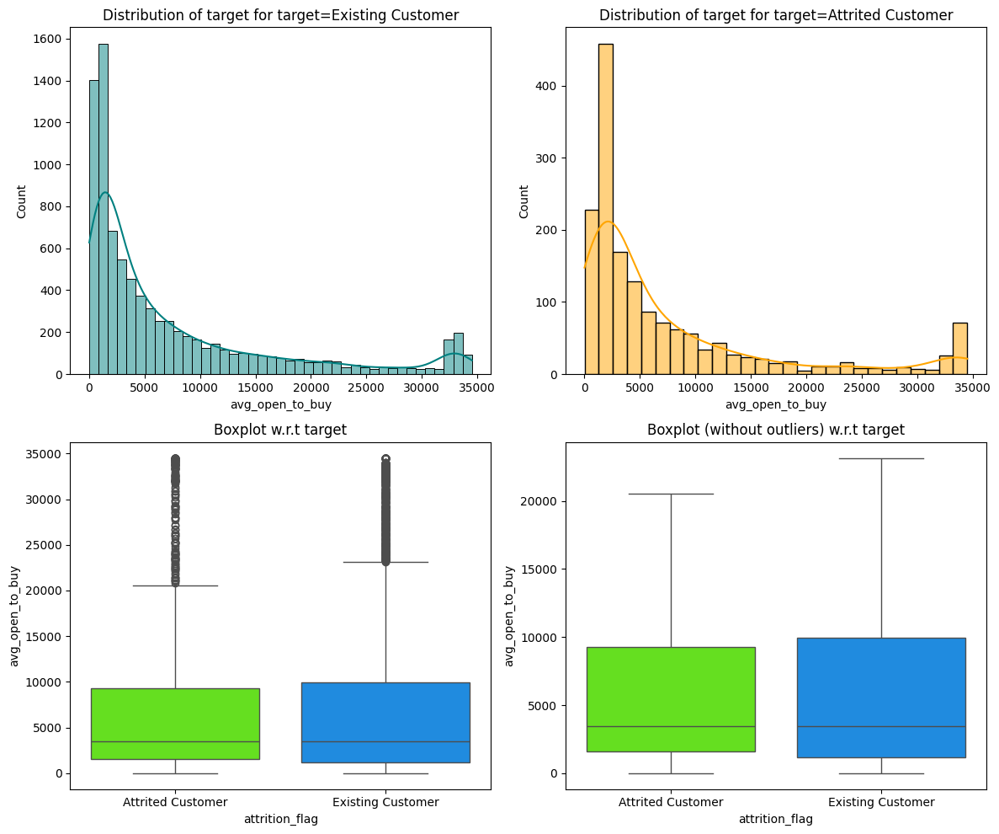

In [64]:
histogram_boxplot(data, "avg_open_to_buy", figsize=(12, 7), kde=True, bins=30)
distribution_plot_wrt_target(data, "avg_open_to_buy", "attrition_flag")

- Right skewed data is observed
- Average Open to Buy has lots of higher end outliers, which shows there are customers using only very small amount of their credit limit

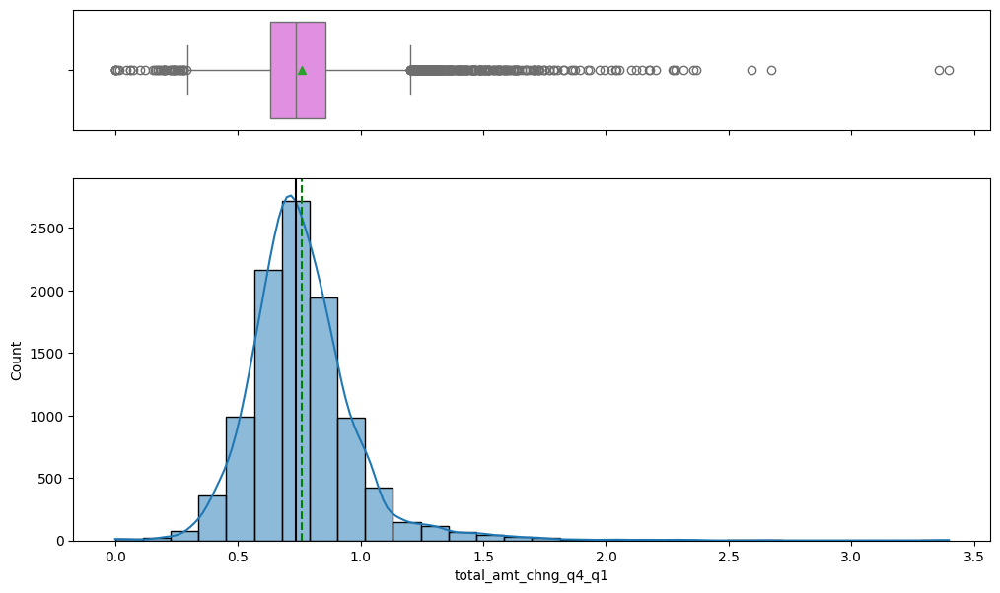

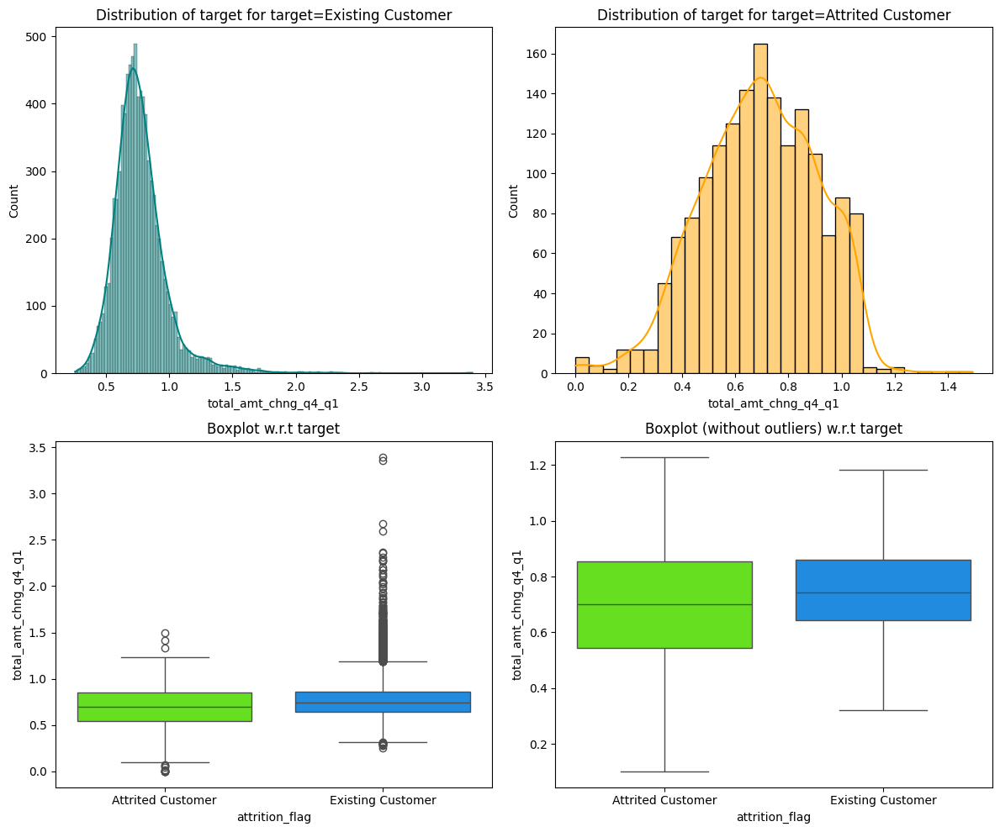

In [67]:
histogram_boxplot(data, "total_amt_chng_q4_q1", figsize=(12, 7), kde=True, bins=30)
distribution_plot_wrt_target(data, "total_amt_chng_q4_q1", "attrition_flag")

### Higher and Lower end, both sides have Outliers.

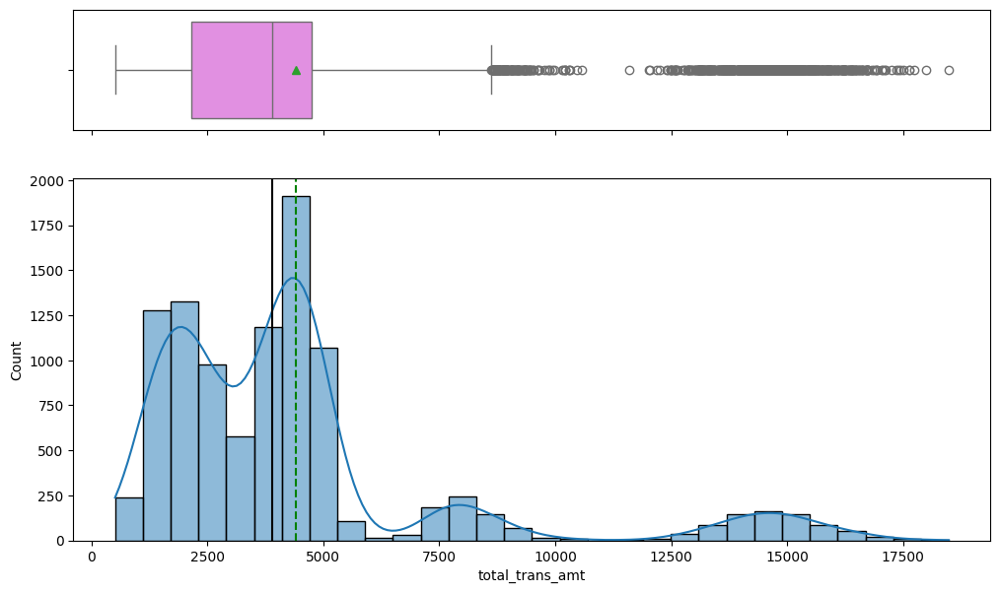

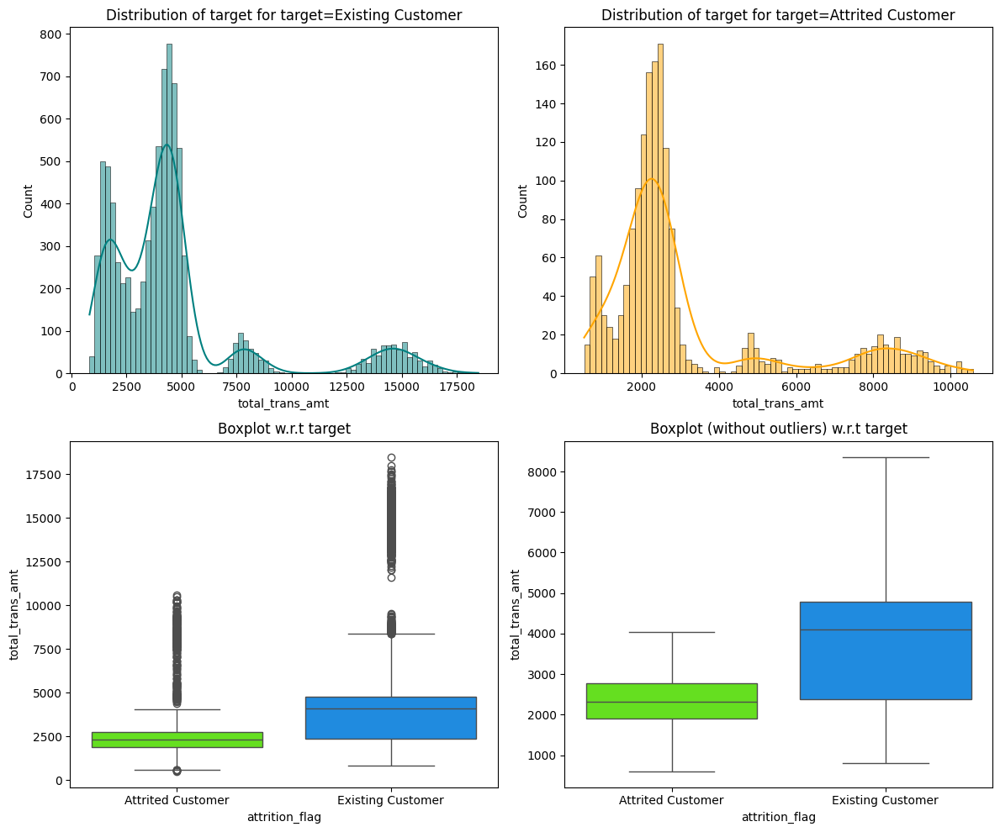

In [68]:
histogram_boxplot(data, "total_trans_amt", figsize=(12, 7), kde=True, bins=30)
distribution_plot_wrt_target(data, "total_trans_amt", "attrition_flag")

### Lots of higher end outliers for Total Transaction Amount.

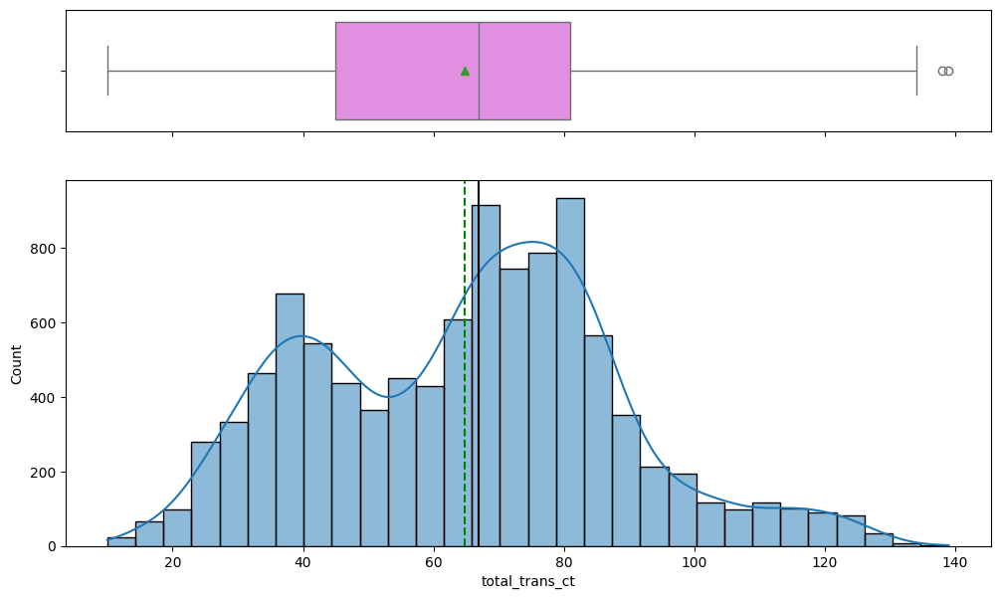

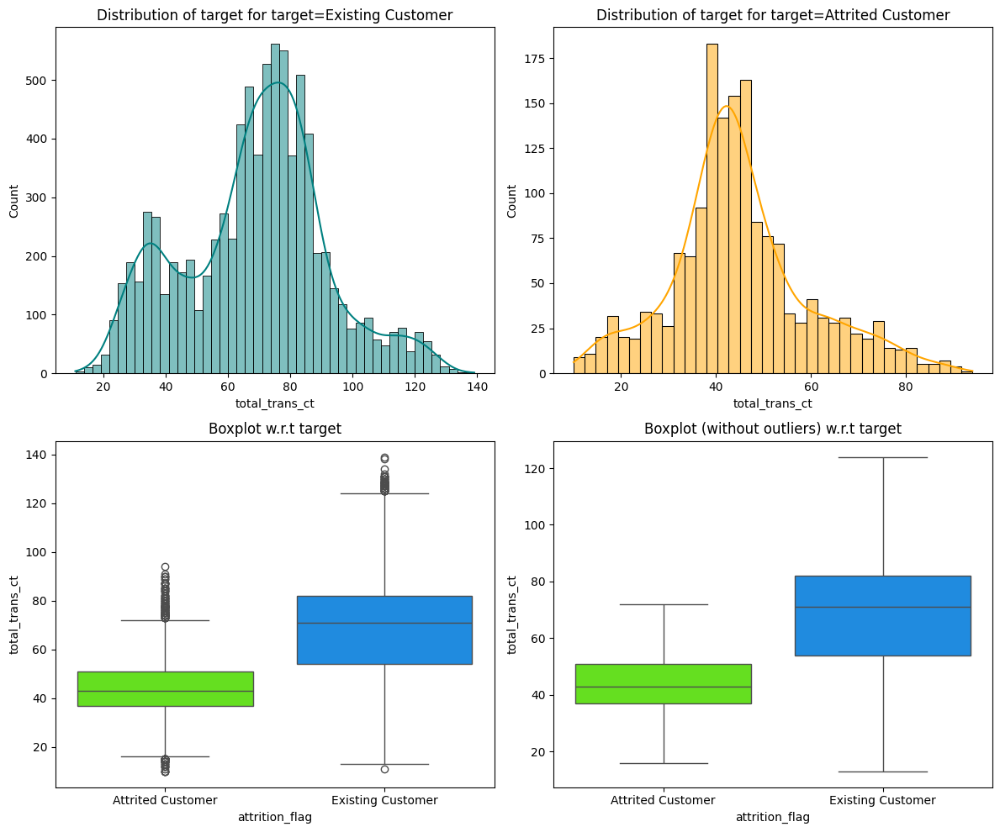

In [69]:
histogram_boxplot(data, "total_trans_ct", figsize=(12, 7), kde=True, bins=30)
distribution_plot_wrt_target(data, "total_trans_ct", "attrition_flag")

### Some outliers at high end.

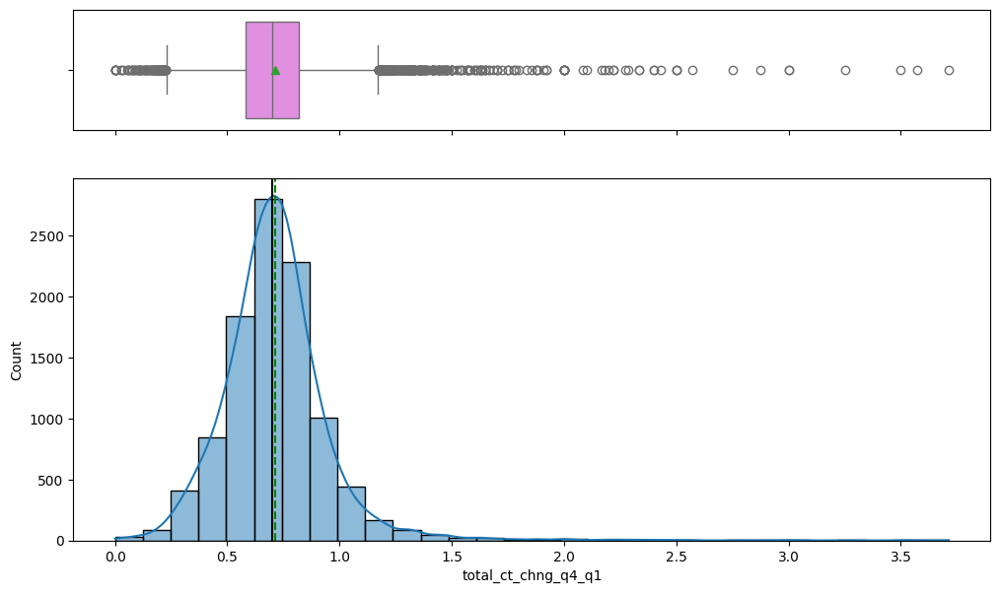

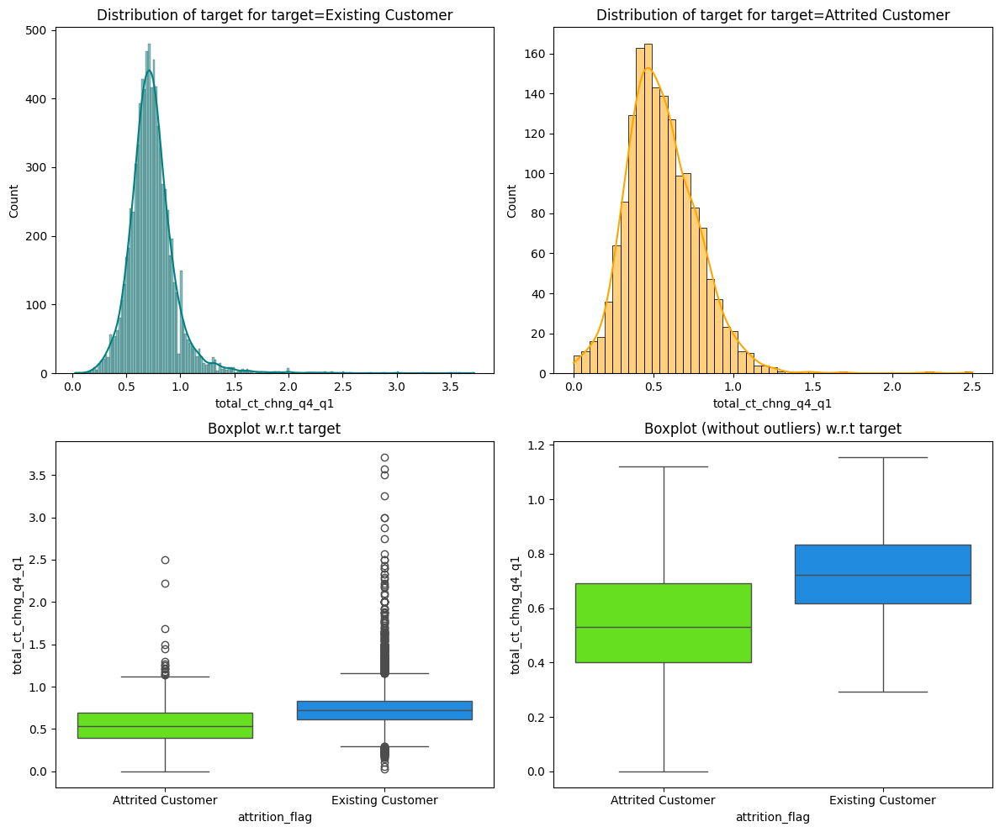

In [70]:
histogram_boxplot(data, "total_ct_chng_q4_q1", figsize=(12, 7), kde=True, bins=30)
distribution_plot_wrt_target(data, "total_ct_chng_q4_q1", "attrition_flag")

### Both higher and lower end carries Outliers.

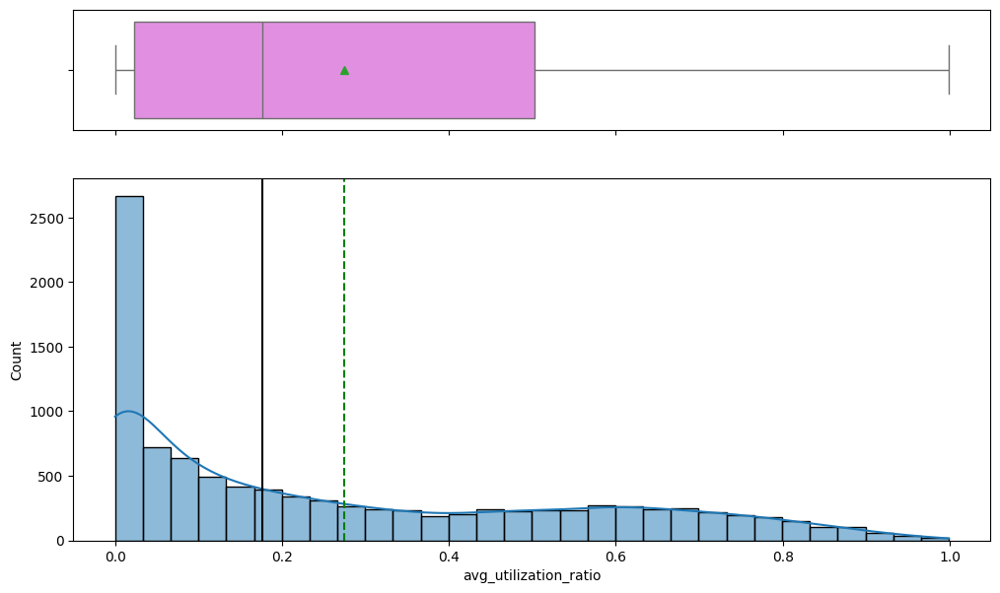

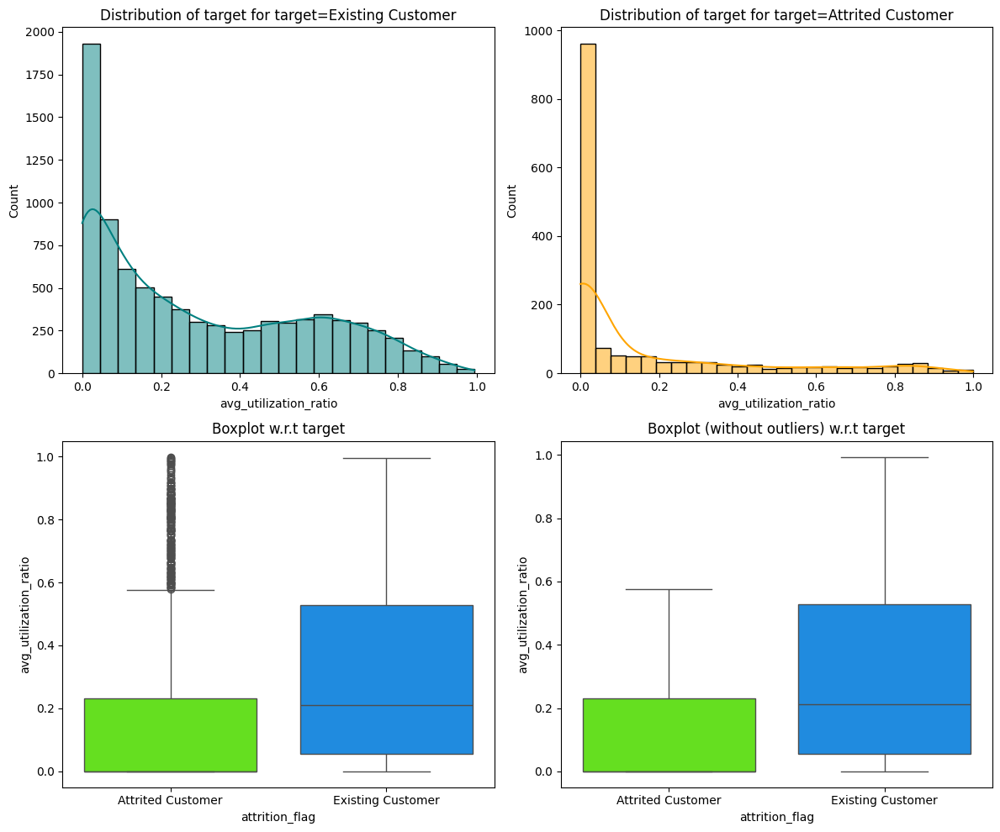

In [71]:
histogram_boxplot(data, "avg_utilization_ratio", figsize=(12, 7), kde=True, bins=30)
distribution_plot_wrt_target(data, "avg_utilization_ratio", "attrition_flag")

### Right skeweness is observed for Average utilization.

### Categorical Features

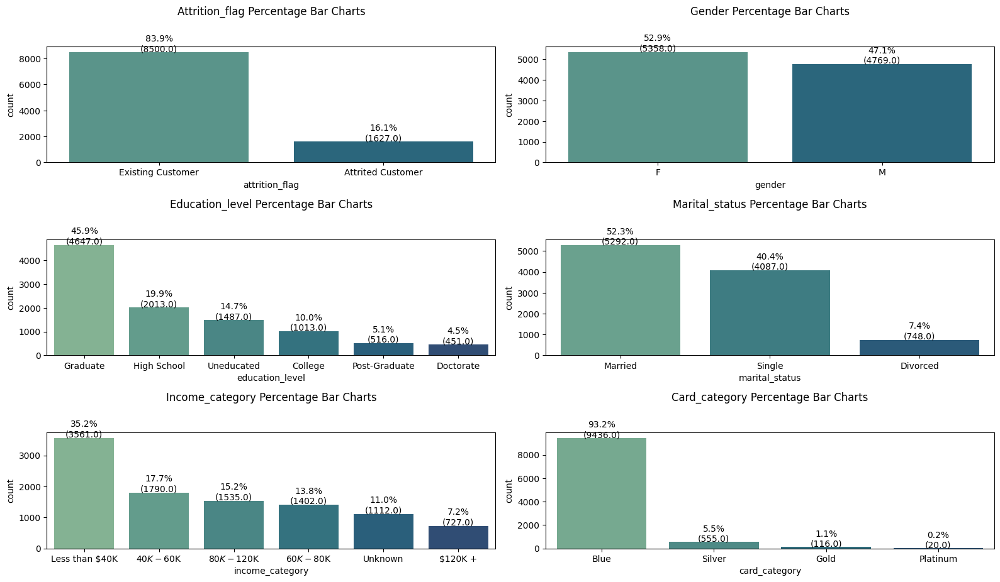

In [76]:
cat_columns = data.select_dtypes(include="category").columns.tolist()
target_variable = "attrition_flag"
#perc_on_bar(data, categocat_columnsry_columns, target_variable)
subplot_cols = 2
subplot_rows = int(len(cat_columns)/2 + 1)
hue = None
perc = True
target = target_variable

plt.figure(figsize=(16,3*subplot_rows))
for i, col in enumerate(cat_columns):
    plt.subplot(subplot_rows,subplot_cols,i+1)
    order = data[col].value_counts(ascending=False).index  # Data order  
    ax=sns.countplot(data=data, x=col, palette = 'crest', order=order, hue=hue);
    for p in ax.patches:
        percentage = '{:.1f}%\n({})'.format(100 * p.get_height()/len(data[target]), p.get_height())
        # Added percentage and actual value
        x = p.get_x() + p.get_width() / 2
        y = p.get_y() + p.get_height() + 40
        if perc:
            plt.annotate(percentage, (x, y), ha='center', color='black', fontsize='medium'); # Annotation on top of bars
        plt.xticks(color='black', fontsize='medium', rotation= (-90 if col=='region' else 0))
        plt.tight_layout()
        plt.title(col.capitalize() + ' Percentage Bar Charts\n\n')

- 93% customers have Blue card
- High Imbalance in data since the existing vs. attrited customers ratio is 84:16
- 31% customers are Graduate
- 85% customers are either Single or Married, where 46.7% of the customers are Married
- 35% customers earn less than $40k and 36% earns $60k or more
- Data is almost equally distributed between Males and Females

## Bi-variate Analysis
### Goal is to find inter-dependencies between features

In [82]:
def box_by_target(data: pd.DataFrame, numeric_columns, target):
    subplot_cols = 2
    subplot_rows = int(len(numeric_columns) / 2 + 1)
    plt.figure(figsize=(16, 3 * subplot_rows))
    for i, col in enumerate(numeric_columns):
        plt.subplot(8, 2, i + 1)
        sns.boxplot(
            data=data,
            x=target,
            y=col,
            orient="vertical",
            palette="Blues",
            showfliers=True,
        )
        plt.tight_layout()
        plt.title(str(i + 1) + ": " + target + " vs. " + col, color="black")

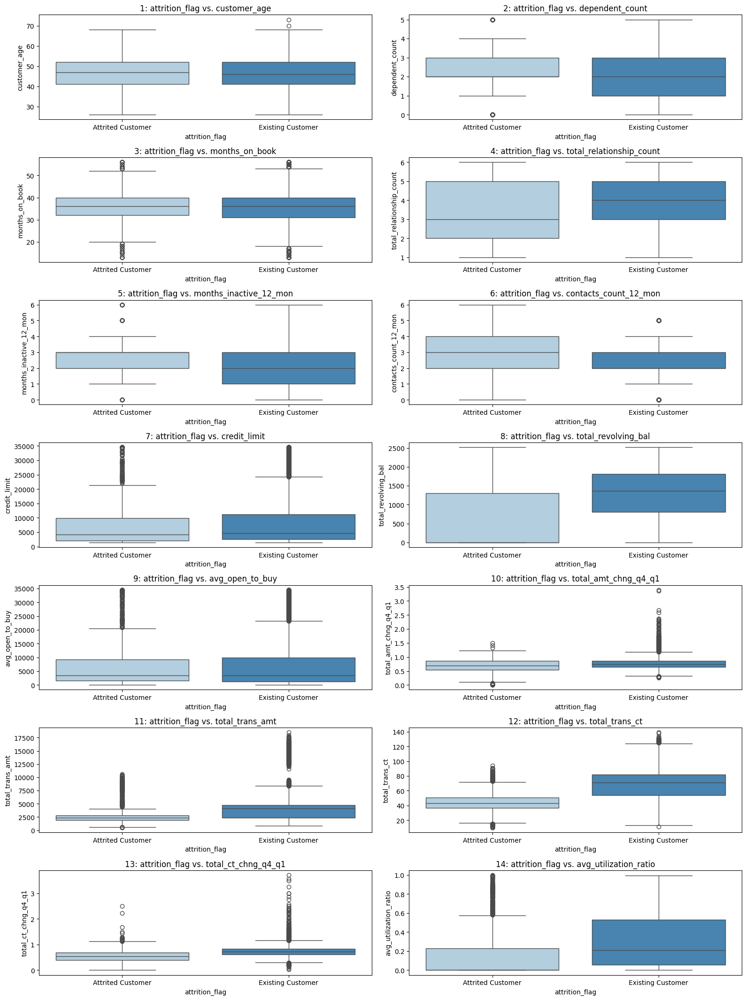

In [83]:
numeric_columns = data.select_dtypes(exclude="category").columns.tolist()
target_variable = "attrition_flag"
box_by_target(data, numeric_columns, target_variable)

### Attrited customers -

- Lower total transaction count
- Lower total transaction amount
- Lower transaction count change Q4 to Q1
- Higher number of times contacted with or by the bank
- Lower utilization ratio

In [84]:
def show_categorical_view(df: pd.DataFrame, x, target):
    """
    Function to create a Bar chart and a Pie chart for categorical variables.
    """
    from matplotlib import cm

    color1 = cm.inferno(np.linspace(0.4, 0.8, 30))
    color2 = cm.viridis(np.linspace(0.4, 0.8, 30))
    sns.set_palette("cubehelix")
    fig, ax = plt.subplots(1, 2, figsize=(16, 4))

    """
    Draw a Pie Chart on first subplot.
    """
    s = data.groupby(x).size()

    mydata_values = s.values.tolist()
    mydata_index = s.index.tolist()

    def func(pct, allvals):
        absolute = int(pct / 100.0 * np.sum(allvals))
        return "{:.1f}%\n({:d})".format(pct, absolute)

    wedges, texts, autotexts = ax[0].pie(
        mydata_values,
        autopct=lambda pct: func(pct, mydata_values),
        textprops=dict(color="w"),
    )

    ax[0].legend(
        wedges,
        mydata_index,
        title=x.capitalize(),
        loc="center left",
        bbox_to_anchor=(1, 0, 0.5, 1),
    )

    plt.setp(autotexts, size=12)

    ax[0].set_title(f"{x.capitalize()} Pie Chart")

    """
    Draw a Bar Graph on second subplot.
    """

    df = pd.pivot_table(
        data, index=[x], columns=[target], values=["credit_limit"], aggfunc=len
    )

    labels = df.index.tolist()
    no = df.values[:, 1].tolist()
    yes = df.values[:, 0].tolist()

    l = np.arange(len(labels))  # the label locations
    width = 0.35  # the width of the bars

    rects1 = ax[1].bar(
        l - width / 2, no, width, label="Existing Customer", color=color1
    )
    rects2 = ax[1].bar(
        l + width / 2, yes, width, label="Attrited Customer", color=color2
    )

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax[1].set_ylabel("Scores")
    ax[1].set_title(f"{x.capitalize()} Bar Graph")
    ax[1].set_xticks(l)
    ax[1].set_xticklabels(labels)
    ax[1].legend()

    def autolabel(rects):

        """Attach a text label above each bar in *rects*, displaying its height."""

        for rect in rects:
            height = rect.get_height()
            ax[1].annotate(
                "{}".format(height),
                xy=(rect.get_x() + rect.get_width() / 2, height),
                xytext=(0, 3),  # 3 points vertical offset
                textcoords="offset points",
                fontsize="medium",
                ha="center",
                va="bottom",
            )

    autolabel(rects1)
    autolabel(rects2)

    fig.tight_layout()
    plt.show()

    """
    Draw a Stacked Bar Graph on bottom.
    """

    sns.set(palette="tab10")
    tab = pd.crosstab(data[x], data[target], normalize="index")

    tab.plot.bar(stacked=True, figsize=(16, 3))
    plt.title(x.capitalize() + " Stacked Bar Plot")
    plt.legend(loc="upper right", bbox_to_anchor=(0, 1))
    plt.show()

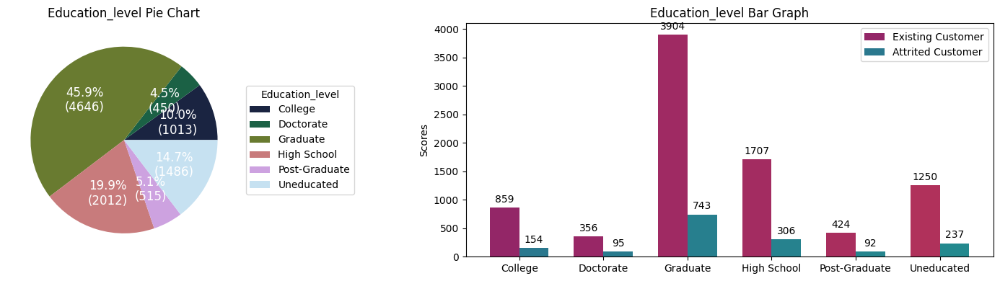

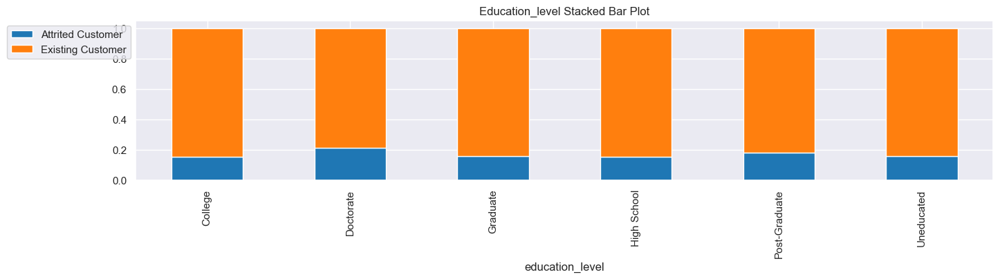

In [85]:
show_categorical_view(data, "education_level", "attrition_flag")

- Attrition does not appear to be related to education level

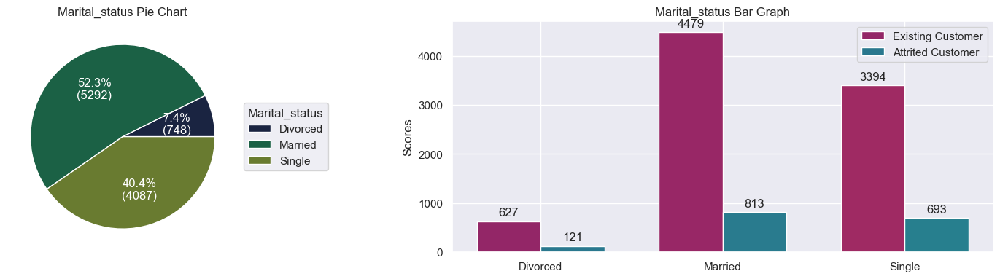

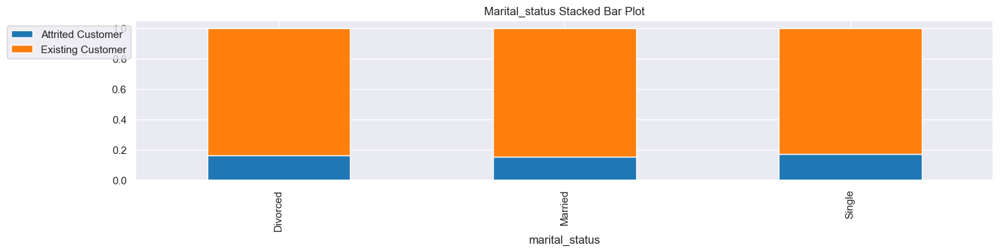

In [88]:
show_categorical_view(data, "marital_status", "attrition_flag")

- Attrition does not appear to be related to marital status

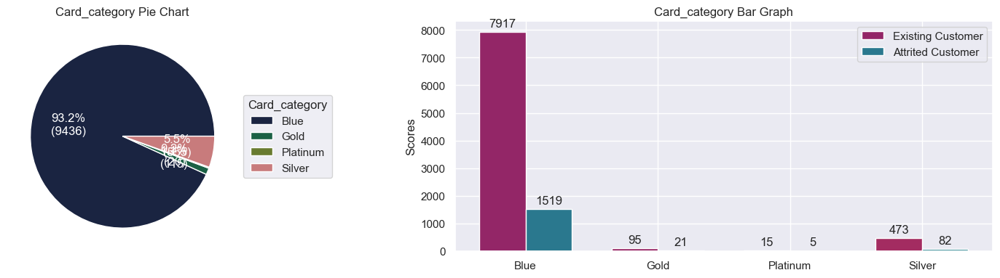

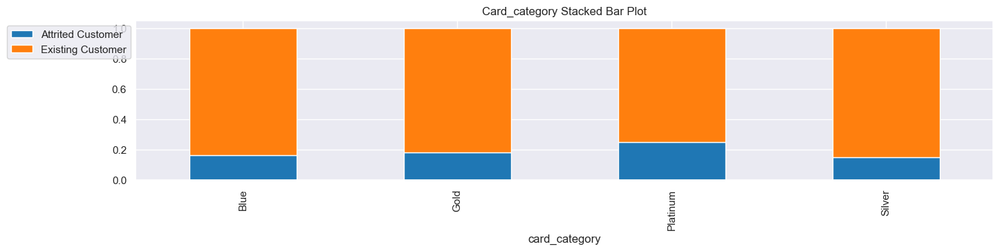

In [89]:
show_categorical_view(data, "card_category", "attrition_flag")

### Attrition is slightly heigher with Platinum card holders, with limited data in that category.

## Multi-variate Analysis

<Figure size 2000x2000 with 0 Axes>

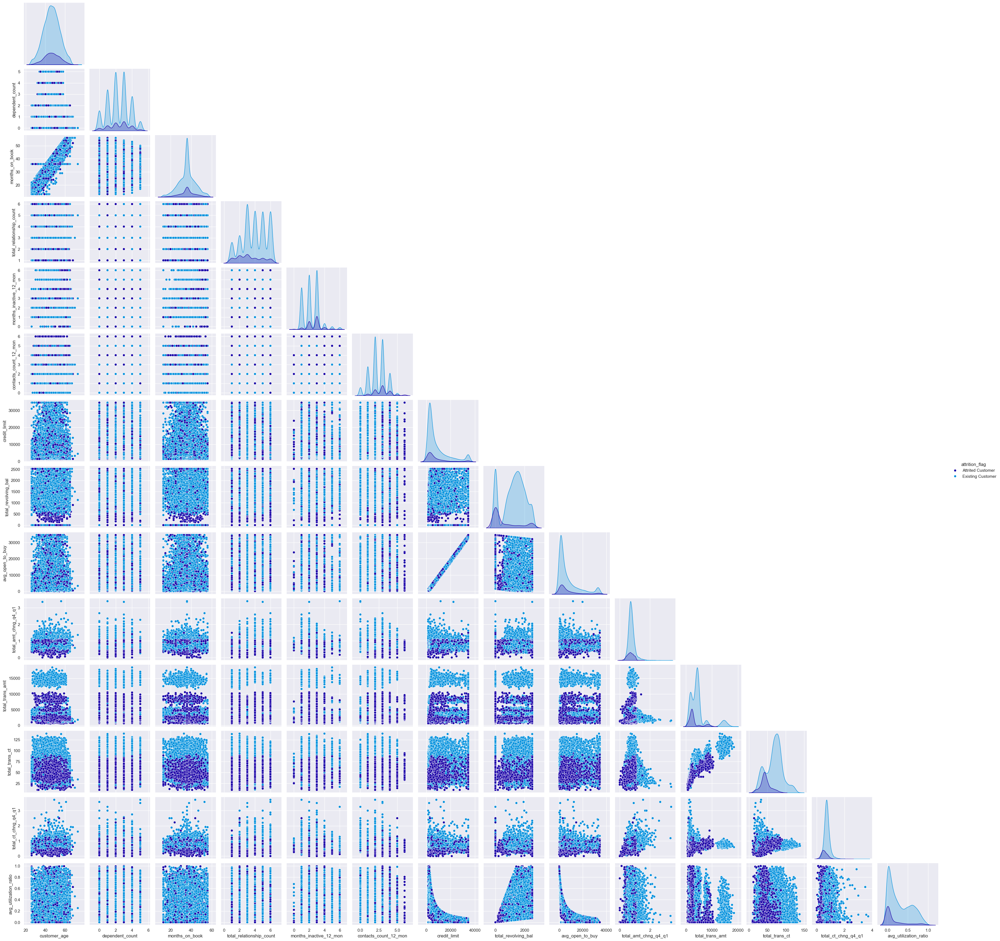

In [90]:
# Show correlations between the numerical features in the dataset
plt.figure(figsize=(20, 20))
sns.set(palette="nipy_spectral")
sns.pairplot(data=data, hue="attrition_flag", corner=True)

- Clusters formation with respect to attrition for 
  - the variables total revolving amount
  - total amount change Q4 to Q1
  - total transaction amount
  - total transaction count
  - total transaction count change Q4 to Q1
- Strong correlation observed between a few columns.


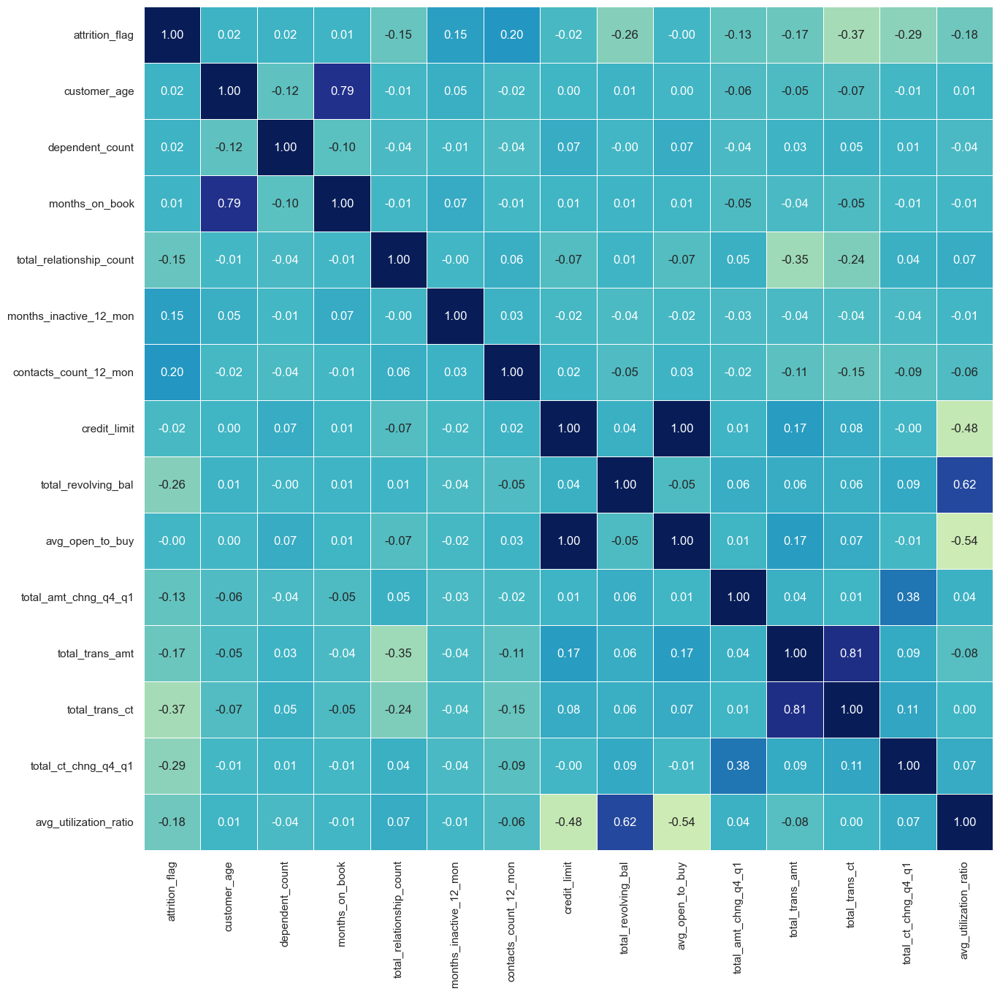

In [91]:
# Show heatmap to explore correlations between numerical features
codes = {'Existing Customer':0, 'Attrited Customer':1}
data_clean = data.copy()
data_clean['attrition_flag'] = data_clean['attrition_flag'].map(codes).astype(int)


sns.set(rc={"figure.figsize": (15, 15)})
sns.heatmap(
    data_clean.corr(),
    annot=True,
    linewidths=0.5,
    center=0,
    cbar=False,
    cmap="YlGnBu",
    fmt="0.2f",
)
plt.show()

- Customer Churn appears to be uncorrelated with Customer Age, Dependent Count, Months on Book, Open to Buy, Credit Limit.
- Months on book and Customer Age have quite strong correlation.
- Credit Limit and Average Open to Buy have 100% collinearity.
- Attrition Flag does not have highly strong correlation with any of the numeric variables.
- Average Utilization Ration and Total Revolving Balance are also a bit correlated it appears.

## Data Pre-Processing

In [95]:
# Building data transformer functions and classe
# Building a function to standardize columns
def feature_name_standardize(df: pd.DataFrame):
    df_ = df.copy()
    df_.columns = [i.replace(" ", "_").lower() for i in df_.columns]
    return df_

# Building a function to drop features
def drop_feature(df: pd.DataFrame, features: list = []):
    df_ = df.copy()
    if len(features) != 0:
        df_ = df_.drop(columns=features)
        
    return df_

# Building a function to treat incorrect value
def mask_value(df: pd.DataFrame, feature: str = None, value_to_mask: str = None, masked_value: str = None):
    df_ = df.copy()
    if feature != None and value_to_mask != None:
        if feature in df_.columns:
            df_[feature] = df_[feature].astype('object')
            df_.loc[df_[df_[feature] == value_to_mask].index, feature] = masked_value
            df_[feature] = df_[feature].astype('category')
            
    return df_

# Building a custom imputer
def impute_category_unknown(df: pd.DataFrame, fill_value: str):
    df_ = df.copy()
    for col in df_.select_dtypes(include='category').columns.tolist():
        df_[col] = df_[col].astype('object')
        df_[col] = df_[col].fillna('Unknown')
        df_[col] = df_[col].astype('category')
    return df_

# Building a custom data preprocessing class with fit and transform methods for standardizing column names
class FeatureNamesStandardizer(TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        """All SciKit-Learn compatible transformers and classifiers have the
        same interface. `fit` always returns the same object."""
        return self

    def transform(self, X):
        """Returns dataframe with column names in lower case with underscores in place of spaces."""
        X_ = feature_name_standardize(X)
        return X_
    
    
# Building a custom data preprocessing class with fit and transform methods for dropping columns
class ColumnDropper(TransformerMixin):
    def __init__(self, features: list):
        self.features = features

    def fit(self, X, y=None):
        """All SciKit-Learn compatible transformers and classifiers have the
        same interface. `fit` always returns the same object."""
        return self

    def transform(self, X):
        """Given a list of columns, returns a dataframe without those columns."""
        X_ = drop_feature(X, features=self.features)
        return X_
        
    

# Building a custom data preprocessing class with fit and transform methods for custom value masking
class CustomValueMasker(TransformerMixin):
    def __init__(self, feature: str, value_to_mask: str, masked_value: str):
        self.feature = feature
        self.value_to_mask = value_to_mask
        self.masked_value = masked_value

    def fit(self, X, y=None):
        """All SciKit-Learn compatible transformers and classifiers have the
        same interface. `fit` always returns the same object."""
        return self

    def transform(self, X):
        """Return a dataframe with the required feature value masked as required."""
        X_ = mask_value(X, self.feature, self.value_to_mask, self.masked_value)
        return X_
    
    
# Building a custom class to one-hot encode using pandas
class PandasOneHot(TransformerMixin):
    def __init__(self, columns: list = None):
        self.columns = columns

    def fit(self, X, y=None):
        """All SciKit-Learn compatible transformers and classifiers have the
        same interface. `fit` always returns the same object."""
        return self

    def transform(self, X):
        """Return a dataframe with the required feature value masked as required."""
        X_ = pd.get_dummies(X, columns = self.columns, drop_first=True)
        return X_
    
# Building a custom class to fill nulls with Unknown
class FillUnknown(TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        """All SciKit-Learn compatible transformers and classifiers have the
        same interface. `fit` always returns the same object."""
        return self

    def transform(self, X):
        """Return a dataframe with the required feature value masked as required."""
        X_ = impute_category_unknown(X, fill_value='Unknown')
        return X_

In [94]:
# Drop unnecessary columns (Client Number, Customer Age, Dependent Count, Months on Book, Open to Buy, Credit Limit)
#data.info()
dfr = data.copy()
data.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
attrition_flag,10127,2,Existing Customer,8500,NaN,NaN,NaN,NaN,NaN,NaN,NaN
customer_age,10127.000,NaN,NaN,NaN,46.326,8.017,26.000,41.000,46.000,52.000,73.000
gender,10127,2,F,5358,NaN,NaN,NaN,NaN,NaN,NaN,NaN
dependent_count,10127.000,NaN,NaN,NaN,2.346,1.299,0.000,1.000,2.000,3.000,5.000
education_level,10127,6,Graduate,4647,NaN,NaN,NaN,NaN,NaN,NaN,NaN
marital_status,10127,3,Married,5292,NaN,NaN,NaN,NaN,NaN,NaN,NaN
income_category,10127,6,Less than $40K,3561,NaN,NaN,NaN,NaN,NaN,NaN,NaN
card_category,10127,4,Blue,9436,NaN,NaN,NaN,NaN,NaN,NaN,NaN
months_on_book,10127.000,NaN,NaN,NaN,35.928,7.986,13.000,31.000,36.000,40.000,56.000
total_relationship_count,10127.000,NaN,NaN,NaN,3.813,1.554,1.000,3.000,4.000,5.000,6.000


In [96]:
# Dropping these columns
columns_to_drop = [
    "credit_limit",
    "dependent_count",
    "months_on_book",
    "avg_open_to_buy",
    "customer_age",
]

# For masking a particular value in a feature
column_to_mask_value = "income_category"
value_to_mask = "abc"
masked_value = "Unknown"

# Random state and loss
seed = 1
loss_func = "logloss"

# Test and Validation sizes
test_size = 0.2
val_size = 0.25

# Dependent Varibale Value map
target_mapper = {"Attrited Customer": 1, "Existing Customer": 0}

In [97]:
# Converting object type to category
cat_columns = data.select_dtypes(include="object").columns.tolist()
data[cat_columns] = data[cat_columns].astype("category")

In [100]:
# Splitting the dataset into dependent and independent variable sets
X = data.drop(columns=["attrition_flag"])
y = data["attrition_flag"].map(target_mapper)

In [101]:
# Splitting data into training, validation and test set:
# first we split data into 2 parts, say temporary and test

X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=test_size, random_state=seed, stratify=y
)

# then we split the temporary set into train and validation

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=val_size, random_state=seed, stratify=y_temp
)
print(
    "Training data shape: \n\n",
    X_train.shape,
    "\n\nValidation Data Shape: \n\n",
    X_val.shape,
    "\n\nTesting Data Shape: \n\n",
    X_test.shape,
)

Training data shape: 

 (6075, 19) 

Validation Data Shape: 

 (2026, 19) 

Testing Data Shape: 

 (2026, 19)


In [102]:
# To Standardize feature names
feature_name_standardizer = FeatureNamesStandardizer()

X_train = feature_name_standardizer.fit_transform(X_train)
X_val = feature_name_standardizer.transform(X_val)
X_test = feature_name_standardizer.transform(X_test)

# To Drop unnecessary columns
column_dropper = ColumnDropper(features=columns_to_drop)

X_train = column_dropper.fit_transform(X_train)
X_val = column_dropper.transform(X_val)
X_test = column_dropper.transform(X_test)

# To Mask incorrect/meaningless value of a feature
value_masker = CustomValueMasker(
    feature=column_to_mask_value, value_to_mask=value_to_mask, masked_value=masked_value
)

X_train = value_masker.fit_transform(X_train)
X_val = value_masker.transform(X_val)
X_test = value_masker.transform(X_test)

# To impute categorical Nulls to Unknown
cat_columns = X_train.select_dtypes(include="category").columns.tolist()
imputer = FillUnknown()

X_train[cat_columns] = imputer.fit_transform(X_train[cat_columns])
X_val[cat_columns] = imputer.transform(X_val[cat_columns])
X_test[cat_columns] = imputer.transform(X_test[cat_columns])

# To encode the data
one_hot = PandasOneHot()

X_train = one_hot.fit_transform(X_train)
X_val = one_hot.transform(X_val)
X_test = one_hot.transform(X_test)


# Scale the numerical columns
robust_scaler = RobustScaler(with_centering=False, with_scaling=True)
num_columns = [
    "total_relationship_count",
    "months_inactive_12_mon",
    "contacts_count_12_mon",
    "total_revolving_bal",
    "total_amt_chng_q4_q1",
    "total_trans_amt",
    "total_trans_ct",
    "total_ct_chng_q4_q1",
    "avg_utilization_ratio",
]

X_train[num_columns] = pd.DataFrame(
    robust_scaler.fit_transform(X_train[num_columns]),
    columns=num_columns,
    index=X_train.index,
)
X_val[num_columns] = pd.DataFrame(
    robust_scaler.transform(X_val[num_columns]), columns=num_columns, index=X_val.index
)
X_test[num_columns] = pd.DataFrame(
    robust_scaler.transform(X_test[num_columns]),
    columns=num_columns,
    index=X_test.index,
)

In [103]:
X_train.head(3)

,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,total_revolving_bal,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio,gender_M,...,marital_status_Married,marital_status_Single,income_category_$40K - $60K,income_category_$60K - $80K,income_category_$80K - $120K,income_category_Less than $40K,income_category_Unknown,card_category_Gold,card_category_Platinum,card_category_Silver
800,3.000,4.000,3.000,1.226,2.044,0.648,1.278,2.249,0.168,1,...,0,1,0,0,0,0,0,0,0,0
498,3.000,2.000,0.000,1.450,1.697,0.524,0.861,2.667,1.376,1,...,1,0,0,0,0,0,1,0,0,0
4356,2.500,1.000,2.000,1.926,3.829,1.661,2.194,3.717,0.775,1,...,1,0,0,0,1,0,0,0,0,0


In [104]:
X_val.head(3)

,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,total_revolving_bal,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio,gender_M,...,marital_status_Married,marital_status_Single,income_category_$40K - $60K,income_category_$60K - $80K,income_category_$80K - $120K,income_category_Less than $40K,income_category_Unknown,card_category_Gold,card_category_Platinum,card_category_Silver
2894,2.500,2.000,3.000,0.000,5.083,1.148,1.528,4.068,0.000,1,...,0,1,0,0,1,0,0,0,0,0
9158,0.500,3.000,1.000,0.000,3.982,3.148,1.639,3.810,0.000,1,...,0,1,0,0,1,0,0,0,0,0
9618,1.500,4.000,3.000,1.584,3.860,5.291,2.833,2.300,0.126,1,...,1,0,0,0,0,0,0,0,1,0


In [105]:
X_test.head(3)

,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,total_revolving_bal,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio,gender_M,...,marital_status_Married,marital_status_Single,income_category_$40K - $60K,income_category_$60K - $80K,income_category_$80K - $120K,income_category_Less than $40K,income_category_Unknown,card_category_Gold,card_category_Platinum,card_category_Silver
9760,1.000,3.000,2.000,0.865,3.316,5.556,2.583,2.544,0.369,1,...,0,1,0,0,1,0,0,0,0,0
7413,2.000,3.000,2.000,0.000,3.219,0.850,1.139,2.190,0.000,1,...,0,1,0,1,0,0,0,0,0,0
6074,1.500,3.000,3.000,0.000,3.237,1.658,2.056,3.215,0.000,0,...,1,0,1,0,0,0,0,0,0,0


## Model Building

### Model evaluation criterion

The nature of predictions made by the classification model will translate as follows:

- True positives (TP) are failures correctly predicted by the model.
- False negatives (FN) are real failures in a generator where there is no detection by model.
- False positives (FP) are failure detections in a generator where there is no failure.

**Which metric to optimize?**

* We need to choose the metric which will ensure that the maximum number of generator failures are predicted correctly by the model.
* We would want Recall to be maximized as greater the Recall, the higher the chances of minimizing false negatives.
* We want to minimize false negatives because if a model predicts that a machine will have no failure when there will be a failure, it will increase the maintenance cost.

**Let's define a function to output different metrics (including recall) on the train and test set and a function to show confusion matrix so that we do not have to use the same code repetitively while evaluating models.**

In [111]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1

        },
        index=[0],
    )

    return df_perf

### Model Building with original data

Sample code for model building with original data

In [110]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
'_______' ## Complete the code to append remaining 3 models in the list models

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_train, model.predict(X_train))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores_val = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))


Training Performance:

Bagging: 0.9815573770491803
Random forest: 1.0

Validation Performance:

Bagging: 0.8312883435582822
Random forest: 0.8190184049079755


In [106]:
# Define function to compute scores
def compute_scores(model, train, test, train_y, test_y, threshold=0.5, flag=False, roc=True):
    score_list = []

    pred_train = model.predict_proba(train)[:, 1] > threshold
    pred_test = model.predict_proba(test)[:, 1] > threshold

    pred_train = np.round(pred_train)
    pred_test = np.round(pred_test)

    train_acc = accuracy_score(pred_train, train_y)
    test_acc = accuracy_score(pred_test, test_y)

    train_recall = recall_score(train_y, pred_train)
    test_recall = recall_score(test_y, pred_test)

    train_precision = precision_score(train_y, pred_train)
    test_precision = precision_score(test_y, pred_test)

    train_f1 = f1_score(train_y, pred_train)
    test_f1 = f1_score(test_y, pred_test)

    pred_train_proba = model.predict_proba(train)[:, 1]
    pred_test_proba = model.predict_proba(test)[:, 1]

    train_roc_auc = roc_auc_score(train_y, pred_train_proba)
    test_roc_auc = roc_auc_score(test_y, pred_test_proba)

    score_list.extend(
        (
            train_acc,
            test_acc,
            train_recall,
            test_recall,
            train_precision,
            test_precision,
            train_f1,
            test_f1,
            train_roc_auc,
            test_roc_auc,
        )
    )

    if flag == True:

        print("Accuracy on training set : ", accuracy_score(pred_train, train_y))
        print("Accuracy on test set : ", accuracy_score(pred_test, test_y))
        print("Recall on training set : ", recall_score(train_y, pred_train))
        print("Recall on test set : ", recall_score(test_y, pred_test))
        print("Precision on training set : ", precision_score(train_y, pred_train))
        print("Precision on test set : ", precision_score(test_y, pred_test))
        print("F1 on training set : ", f1_score(train_y, pred_train))
        print("F1 on test set : ", f1_score(test_y, pred_test))

    if roc == True:
        if flag == True:
            print(
                "ROC-AUC Score on training set : ",
                roc_auc_score(train_y, pred_train_proba),
            )
            print(
                "ROC-AUC Score on test set : ", roc_auc_score(test_y, pred_test_proba)
            )

    return score_list

In [107]:
# create confusion matrix
def create_confusion_matrix(model, test_X, y_actual, labels=[1, 0]):
    y_predict = model.predict(test_X)
    cm = metrics.confusion_matrix(y_actual, y_predict, labels=[1, 0])
    df_cm = pd.DataFrame(
        cm,
        index=[i for i in ["Actual - Attrited", "Actual - Existing"]],
        columns=[i for i in ["Predicted - Attrited", "Predicted - Existing"]],
    )
    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten() / np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in zip(group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(2, 2)
    plt.figure(figsize=(5, 3))
    sns.heatmap(df_cm, annot=labels, fmt="", cmap="Blues").set(title="Confusion Matrix")

In [108]:
# Create score model
model_names = []
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []
f1_train = []
f1_test = []
roc_auc_train = []
roc_auc_test = []
cross_val_train = []


def create_score_model(model_name, score, cv_res):
    model_names.append(model_name)
    acc_train.append(score[0])
    acc_test.append(score[1])
    recall_train.append(score[2])
    recall_test.append(score[3])
    precision_train.append(score[4])
    precision_test.append(score[5])
    f1_train.append(score[6])
    f1_test.append(score[7])
    roc_auc_train.append(score[8])
    roc_auc_test.append(score[9])
    cross_val_train.append(cv_res)

### Model Building with Oversampled data


In [116]:
print("Before UpSampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before UpSampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

sm = SMOTE(
    sampling_strategy="minority", k_neighbors=10, random_state=seed
)  # Synthetic Minority Over Sampling Technique

X_train_over, y_train_over = sm.fit_resample(X_train, y_train)


print("After UpSampling, counts of label 'Yes': {}".format(sum(y_train_over == 1)))
print("After UpSampling, counts of label 'No': {} \n".format(sum(y_train_over == 0)))


print("After UpSampling, the shape of train_X: {}".format(X_train_over.shape))
print("After UpSampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before UpSampling, counts of label 'Yes': 976
Before UpSampling, counts of label 'No': 5099 

After UpSampling, counts of label 'Yes': 5099
After UpSampling, counts of label 'No': 5099 

After UpSampling, the shape of train_X: (10198, 25)
After UpSampling, the shape of train_y: (10198,) 



In [118]:
models_over = []

models_over.append(("Bagging UpSampling", BaggingClassifier(random_state=seed)))
models_over.append(
    ("Random forest UpSampling", RandomForestClassifier(random_state=seed))
)
models_over.append(("GBM UpSampling", GradientBoostingClassifier(random_state=seed)))
models_over.append(("Adaboost UpSampling", AdaBoostClassifier(random_state=seed)))
models_over.append(
    ("Xgboost UpSampling", XGBClassifier(random_state=seed, eval_metric=loss_func))
)
models_over.append(("dtree UpSampling", DecisionTreeClassifier(random_state=seed)))
models_over.append(("Light GBM UpSampling", lgb.LGBMClassifier(random_state=seed)))

for name, model in models_over:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=10, shuffle=True, random_state=1
    )  # Setting number of splits equal to 10

    cv_result_over = cross_val_score(
        estimator=model, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
    )
    cv_results.append(cv_result_over)

    model.fit(X_train_over, y_train_over)
    model_score_over = compute_scores(
        model, X_train_over, X_val, y_train_over, y_val
    )
    create_score_model(name, model_score_over, cv_result_over.mean())

print("Operation Completed!")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4589, number of negative: 4589
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 9178, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4589, number of negative: 4589
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2325
[LightGBM] [Info] Number of data points in the train set: 9178, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg

In [119]:
comparison_frame = pd.DataFrame(
    {
        "Model": model_names,
        "Cross_Val_Score_Train": cross_val_train,
        "Train_Accuracy": acc_train,
        "Test_Accuracy": acc_test,
        "Train_Recall": recall_train,
        "Test_Recall": recall_test,
        "Train_Precision": precision_train,
        "Test_Precision": precision_test,
        "Train_F1": f1_train,
        "Test_F1": f1_test,
        "Train_ROC_AUC": roc_auc_train,
        "Test_ROC_AUC": roc_auc_test,
    }
)

# Sorting models in decreasing order of test recall
comparison_frame.sort_values(
    by=["Test_Recall", "Cross_Val_Score_Train"], ascending=False
).style.highlight_max(color="lightgreen", axis=0).highlight_min(color="pink", axis=0)

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
11,Xgboost UpSampling,0.977644,1.000000,0.973840,1.000000,0.929448,1.000000,0.909910,1.000000,0.919575,1.000000,0.993623
9,GBM UpSampling,0.969211,0.971367,0.955577,0.976858,0.917178,0.966246,0.825967,0.971523,0.869186,0.995831,0.987483
13,Light GBM UpSampling,0.979016,0.998333,0.969398,0.999412,0.914110,0.997260,0.897590,0.998335,0.905775,0.999981,0.992822
10,Adaboost UpSampling,0.955680,0.954501,0.943238,0.961757,0.907975,0.947999,0.776903,0.954829,0.837341,0.991273,0.982850
6,Light GBM,0.844277,0.999506,0.974334,0.998975,0.898773,0.997953,0.939103,0.998464,0.918495,0.999990,0.993659
4,Xgboost,0.849369,0.999835,0.969891,1.000000,0.883436,0.998976,0.926045,0.999488,0.904239,1.000000,0.993928
8,Random forest UpSampling,0.979998,1.000000,0.954590,1.000000,0.880368,1.000000,0.844118,1.000000,0.861862,1.000000,0.986432
2,GBM,0.812487,0.969712,0.969398,0.873975,0.874233,0.933260,0.931373,0.902646,0.901899,0.992689,0.989946
3,Adaboost,0.799137,0.956379,0.961007,0.830943,0.849693,0.890231,0.902280,0.859565,0.875197,0.987073,0.979432
7,Bagging UpSampling,0.960973,0.997254,0.944719,0.996666,0.837423,0.997840,0.822289,0.997253,0.829787,0.999978,0.974612


### 4 models Light GBM, GBM, AdaBoost, XGBoost trained with over/up-sampled data appears to be good.

### Model Building with Undersampled data

In [112]:
# Random undersampler for under sampling the data
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

In [113]:
models = []  
cv_results = []

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=seed)))
models.append(("Random forest", RandomForestClassifier(random_state=seed)))
models.append(("GBM", GradientBoostingClassifier(random_state=seed)))
models.append(("Adaboost", AdaBoostClassifier(random_state=seed)))
models.append(("Xgboost", XGBClassifier(random_state=seed, eval_metric=loss_func)))
models.append(("dtree", DecisionTreeClassifier(random_state=seed)))
models.append(("Light GBM", lgb.LGBMClassifier(random_state=seed)))

# For each model, run cross validation on 9 folds (+ 1 validation fold) with scoring for recall
for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=10, shuffle=True, random_state=1
    )  # Setting number of splits equal to 10

    cv_result = cross_val_score(
        estimator=model, X=X_train, y=y_train, scoring=scoring, cv=kfold
    )
    cv_results.append(cv_result)

    model.fit(X_train, y_train)
    model_score = compute_scores(model, X_train, X_val, y_train, y_val)
    create_score_model(name, model_score, cv_result.mean())

print("Operation Completed!")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 878, number of negative: 4589
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1447
[LightGBM] [Info] Number of data points in the train set: 5467, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.160600 -> initscore=-1.653771
[LightGBM] [Info] Start training from score -1.653771
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 878, number of negative: 4589
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1446
[LightGBM] [Info] Number of data points in the train set: 5467, number of used feature

In [114]:
comparison_frame = pd.DataFrame(
    {
        "Model": model_names,
        "Cross_Val_Score_Train": cross_val_train,
        "Train_Accuracy": acc_train,
        "Test_Accuracy": acc_test,
        "Train_Recall": recall_train,
        "Test_Recall": recall_test,
        "Train_Precision": precision_train,
        "Test_Precision": precision_test,
        "Train_F1": f1_train,
        "Test_F1": f1_test,
        "Train_ROC_AUC": roc_auc_train,
        "Test_ROC_AUC": roc_auc_test,
    }
)

# Sorting models in decreasing order of test recall
comparison_frame.sort_values(
    by=["Cross_Val_Score_Train", "Test_Recall"], ascending=False
).style.highlight_max(color="lightgreen", axis=0).highlight_min(color="pink", axis=0)

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
4,Xgboost,0.849369,0.999835,0.969891,1.000000,0.883436,0.998976,0.926045,0.999488,0.904239,1.000000,0.993928
6,Light GBM,0.844277,0.999506,0.974334,0.998975,0.898773,0.997953,0.939103,0.998464,0.918495,0.999990,0.993659
2,GBM,0.812487,0.969712,0.969398,0.873975,0.874233,0.933260,0.931373,0.902646,0.901899,0.992689,0.989946
3,Adaboost,0.799137,0.956379,0.961007,0.830943,0.849693,0.890231,0.902280,0.859565,0.875197,0.987073,0.979432
0,Bagging,0.783894,0.996049,0.957552,0.981557,0.831288,0.993776,0.897351,0.987629,0.863057,0.999890,0.977364
1,Random forest,0.773543,1.000000,0.961500,1.000000,0.819018,1.000000,0.933566,1.000000,0.872549,1.000000,0.985377
5,dtree,0.749043,1.000000,0.936821,1.000000,0.803681,1.000000,0.803681,1.000000,0.803681,1.000000,0.883017


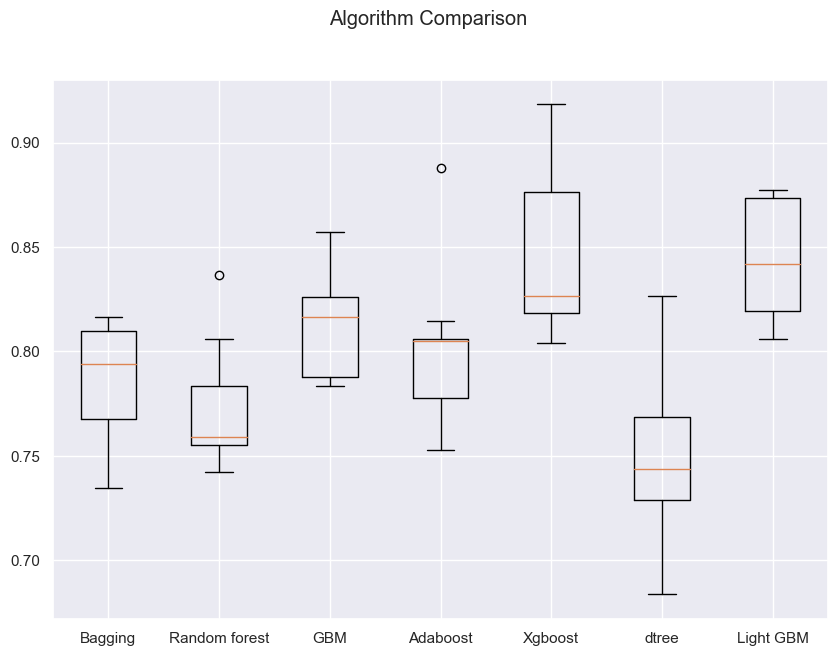

In [115]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure(figsize=(10, 7))

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(cv_results)
ax.set_xticklabels(model_names)

plt.show()

### XGBoost, GBM, Light GBM models and Ada Boost appear to have good potential.

In [121]:
# Undersampling train data using Random Under Sampler
# Random undersampling - randomly selecting examples from the majority class and deleting them from the training dataset until a balanced dataset is created.
rus = RandomUnderSampler(random_state=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)
print("Before Under Sampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Under Sampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

print("After Under Sampling, counts of label 'Yes': {}".format(sum(y_train_un == 1)))
print("After Under Sampling, counts of label 'No': {} \n".format(sum(y_train_un == 0)))

print("After Under Sampling, the shape of train_X: {}".format(X_train_un.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_un.shape))

Before Under Sampling, counts of label 'Yes': 976
Before Under Sampling, counts of label 'No': 5099 

After Under Sampling, counts of label 'Yes': 976
After Under Sampling, counts of label 'No': 976 

After Under Sampling, the shape of train_X: (1952, 25)
After Under Sampling, the shape of train_y: (1952,) 



## Build Models with Undersampled Data

In [123]:
models_under = []

models_under.append(("Bagging DownSampling", BaggingClassifier(random_state=seed)))
models_under.append(
    ("Random forest DownSampling", RandomForestClassifier(random_state=seed))
)
models_under.append(("GBM DownSampling", GradientBoostingClassifier(random_state=seed)))
models_under.append(("Adaboost DownSampling", AdaBoostClassifier(random_state=seed)))
models_under.append(
    ("Xgboost DownSampling", XGBClassifier(random_state=seed, eval_metric=loss_func))
)
models_under.append(("dtree DownSampling", DecisionTreeClassifier(random_state=seed)))
models_under.append(("Light GBM DownSampling", lgb.LGBMClassifier(random_state=seed)))

for name, model in models_under:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=10, shuffle=True, random_state=1
    )  # Setting number of splits equal to 10

    cv_result_under = cross_val_score(
        estimator=model, X=X_train_un, y=y_train_un, scoring=scoring, cv=kfold
    )
    cv_results.append(cv_result_under)

    model.fit(X_train_un, y_train_un)
    model_score_under = compute_scores(model, X_train_un, X_val, y_train_un, y_val)
    create_score_model(name, model_score_under, cv_result_under.mean())

print("Operation Completed!")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 878, number of negative: 878
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000153 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1430
[LightGBM] [Info] Number of data points in the train set: 1756, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 878, number of negative: 878
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1430
[LightGBM] [Info] Number of data points in the train set: 1756, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.5

In [124]:
comparison_frame = pd.DataFrame(
    {
        "Model": model_names,
        "Cross_Val_Score_Train": cross_val_train,
        "Train_Accuracy": acc_train,
        "Test_Accuracy": acc_test,
        "Train_Recall": recall_train,
        "Test_Recall": recall_test,
        "Train_Precision": precision_train,
        "Test_Precision": precision_test,
        "Train_F1": f1_train,
        "Test_F1": f1_test,
        "Train_ROC_AUC": roc_auc_train,
        "Test_ROC_AUC": roc_auc_test,
    }
)
# Sorting models in decreasing order of test recall
comparison_frame.sort_values(
    by=["Test_Recall", "Cross_Val_Score_Train"], ascending=False
).style.highlight_max(color="lightgreen", axis=0).highlight_min(color="pink", axis=0)

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
16,GBM DownSampling,0.949758,0.968238,0.940276,0.978484,0.963190,0.958835,0.742317,0.968560,0.838451,0.995826,0.990538
17,Adaboost DownSampling,0.928203,0.947746,0.936328,0.952869,0.963190,0.943205,0.728538,0.948012,0.829590,0.989348,0.985150
18,Xgboost DownSampling,0.951820,1.000000,0.938302,1.000000,0.957055,1.000000,0.737589,1.000000,0.833111,1.000000,0.990045
20,Light GBM DownSampling,0.951799,1.000000,0.937808,1.000000,0.957055,1.000000,0.735849,1.000000,0.832000,1.000000,0.990982
15,Random forest DownSampling,0.942573,1.000000,0.930898,1.000000,0.938650,1.000000,0.718310,1.000000,0.813830,1.000000,0.980694
11,Xgboost UpSampling,0.977644,1.000000,0.973840,1.000000,0.929448,1.000000,0.909910,1.000000,0.919575,1.000000,0.993623
14,Bagging DownSampling,0.927193,0.995389,0.922507,0.992828,0.920245,0.997940,0.696056,0.995378,0.792602,0.999797,0.971395
9,GBM UpSampling,0.969211,0.971367,0.955577,0.976858,0.917178,0.966246,0.825967,0.971523,0.869186,0.995831,0.987483
13,Light GBM UpSampling,0.979016,0.998333,0.969398,0.999412,0.914110,0.997260,0.897590,0.998335,0.905775,0.999981,0.992822
10,Adaboost UpSampling,0.955680,0.954501,0.943238,0.961757,0.907975,0.947999,0.776903,0.954829,0.837341,0.991273,0.982850


- XGBoost, AdaBoost, Light GBM and GBM are 4 models trained with undersampled data
- Now lets's try to tune these 4 models using Random Search CV

### HyperparameterTuning

### Model Tuning using RandomizedSearchCV

In [125]:
# Tuning XGBOOST with Down Sampled data
model = XGBClassifier(random_state=seed, eval_metric=loss_func)


# Parameter grid to pass in RandomizedSearchCV
param_grid={'n_estimators':np.arange(50,500,50),
            'scale_pos_weight':[2,5,10],
            'learning_rate':[0.01,0.1,0.2,0.05],
            'gamma':[0,1,3,5],
            'subsample':[0.8,0.9,1],
            'max_depth':np.arange(4,20,1),
            'reg_lambda':[5,10, 15, 20]} 

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
xgb_tuned = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=10, random_state=seed, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
xgb_tuned.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(xgb_tuned.best_params_,xgb_tuned.best_score_))

Best parameters are {'subsample': 1, 'scale_pos_weight': 10, 'reg_lambda': 10, 'n_estimators': 50, 'max_depth': 11, 'learning_rate': 0.01, 'gamma': 3} with CV score=1.0:


In [126]:
xgb_tuned_model = XGBClassifier(
    n_estimators=150,
    scale_pos_weight=10,
    subsample=1,
    reg_lambda=20,
    max_depth=5,
    learning_rate=0.01,
    gamma=0,
    eval_metric=loss_func,
    random_state=seed,
)
# Fit the model on training data
xgb_tuned_model.fit(X_train_un, y_train_un)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.01, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=150,
              n_jobs=None, num_parallel_tree=None, random_state=1, ...)

In [128]:
# Fetch scores for the model
xgb_tuned_score = compute_scores(xgb_tuned_model, X_train_un, X_val, y_train_un, y_val, flag=True)

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

scoring = "recall"
xgb_down_cv = cross_val_score(estimator=xgb_tuned_model, X=X_train_un, y=y_train_un, scoring=scoring, cv=kfold
)

create_score_model(
    "XGB Tuned with Down Sampling", xgb_tuned_score, xgb_down_cv.mean()
)

Accuracy on training set :  0.8253073770491803
Accuracy on test set :  0.6880552813425469
Recall on training set :  1.0
Recall on test set :  1.0
Precision on training set :  0.7410782080485953
Precision on test set :  0.34029227557411273
F1 on training set :  0.8512865242040994
F1 on test set :  0.5077881619937694
ROC-AUC Score on training set :  0.976869562113679
ROC-AUC Score on test set :  0.9677057019126669


#### Sample Parameter Grids

**Note**

1. Sample parameter grids have been provided to do necessary hyperparameter tuning. These sample grids are expected to provide a balance between model performance improvement and execution time. One can extend/reduce the parameter grid based on execution time and system configuration.
  - Please note that if the parameter grid is extended to improve the model performance further, the execution time will increase


- For Gradient Boosting:

```
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}
```

- For Adaboost:

```
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}
```

- For Bagging Classifier:

```
param_grid = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9],
    'n_estimators' : [30,50,70],
}
```
- For Random Forest:

```
param_grid = {
    "n_estimators": [50,110,25],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1)
}
```

- For Decision Trees:

```
param_grid = {
    'max_depth': np.arange(2,6),
    'min_samples_leaf': [1, 4, 7],
    'max_leaf_nodes' : [10, 15],
    'min_impurity_decrease': [0.0001,0.001]
}
```

- For XGBoost (optional):

```
param_grid={'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9]
}
```

#### Sample tuning method for Decision tree with original data

In [129]:
# defining model
Model = DecisionTreeClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {'max_depth': np.arange(2,6),
              'min_samples_leaf': [1, 4, 7],
              'max_leaf_nodes' : [10,15],
              'min_impurity_decrease': [0.0001,0.001] }

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'min_samples_leaf': 7, 'min_impurity_decrease': 0.0001, 'max_leaf_nodes': 15, 'max_depth': 5} with CV score=0.7498953427524857:


#### Sample tuning method for Decision tree with oversampled data

In [130]:
# defining model
Model = DecisionTreeClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {'max_depth': np.arange(2,6),
              'min_samples_leaf': [1, 4, 7],
              'max_leaf_nodes' : [10,15],
              'min_impurity_decrease': [0.0001,0.001] }

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_over,y_train_over)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'min_samples_leaf': 1, 'min_impurity_decrease': 0.001, 'max_leaf_nodes': 15, 'max_depth': 4} with CV score=0.9072404702803594:


#### Sample tuning method for Decision tree with undersampled data

In [131]:
# defining model
Model = DecisionTreeClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {'max_depth': np.arange(2,6),
              'min_samples_leaf': [1, 4, 7],
              'max_leaf_nodes' : [10,15],
              'min_impurity_decrease': [0.0001,0.001] }

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'min_samples_leaf': 7, 'min_impurity_decrease': 0.0001, 'max_leaf_nodes': 10, 'max_depth': 5} with CV score=0.909848246991104:


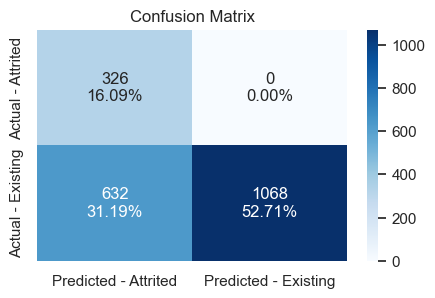

In [132]:
create_confusion_matrix(xgb_tuned_model, X_val, y_val)

In [133]:
# Tuning AdaBoost with Down Sampled data
model = AdaBoostClassifier(random_state=seed)

# Parameter grid to pass in RandomizedSearchCV
param_grid={'n_estimators':np.arange(50,2000,50),
            'learning_rate':[0.01,0.1,0.2,0.05]} 

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
ada_tuned = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=10, random_state=seed, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
ada_tuned.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(ada_tuned.best_params_,ada_tuned.best_score_))

Best parameters are {'n_estimators': 1100, 'learning_rate': 0.05} with CV score=0.9415632232274354:


In [134]:
# building model with best parameters
ada_tuned_model = AdaBoostClassifier(
    n_estimators=1050, learning_rate=0.1, random_state=seed
)
# Fit the model on training data
ada_tuned_model.fit(X_train_un, y_train_un)

AdaBoostClassifier(learning_rate=0.1, n_estimators=1050, random_state=1)

In [135]:
ada_tuned_model_score = compute_scores(
    ada_tuned_model, X_train, X_val, y_train, y_val
)

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

scoring = "recall"
ada_down_cv = cross_val_score(
    estimator=ada_tuned_model, X=X_train_un, y=y_train_un, scoring=scoring, cv=kfold
)


create_score_model(
    "AdaBoost Tuned with Down Sampling", ada_tuned_model_score, ada_down_cv.mean()
)

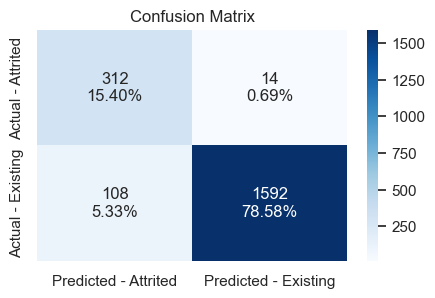

In [136]:
create_confusion_matrix(ada_tuned_model, X_val, y_val)

### Tuning Light GBM with Down-Sampled data

In [137]:
model = lgb.LGBMClassifier(random_state=seed)

# Hyper parameters
min_gain_to_split = [0.01, 0.1, 0.2, 0.3]
min_data_in_leaf = [10, 20, 30, 40, 50]
feature_fraction = [0.8, 0.9, 1.0]
max_depth = [5, 8, 15, 25, 30]
extra_trees = [True, False]
learning_rate = [0.01,0.1,0.2,0.05]

# Parameter grid to pass in RandomizedSearchCV
param_grid={'min_gain_to_split': min_gain_to_split,
               'min_data_in_leaf': min_data_in_leaf,
               'feature_fraction': feature_fraction,
               'max_depth': max_depth,
               'extra_trees': extra_trees,
               'learning_rate': learning_rate,
               'boosting_type': ['gbdt'],
               'objective': ['binary'],
               'is_unbalance': [True],
               'metric': ['binary_logloss'],} 

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
lgbm_tuned = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=10, random_state=seed, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
lgbm_tuned.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(lgbm_tuned.best_params_,lgbm_tuned.best_score_))

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=0.3, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=0.3, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3
[LightGBM] [Info] Number of positive: 976, number of negative: 976
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can s

In [138]:
lgbm_tuned_model = lgb.LGBMClassifier(
               min_gain_to_split = 0.01,
               min_data_in_leaf = 50,
               feature_fraction = 0.8,
               max_depth = 8,
               extra_trees = False,
               learning_rate = 0.2,
               objective = 'binary',
               metric = 'binary_logloss',
               is_unbalance = True,
               boosting_type = 'gbdt',
               random_state = seed
)
# Fit the model on training data
lgbm_tuned_model.fit(X_train_un, y_train_un)

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=0.01, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=0.01, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01
[LightGBM] [Info] Number of positive: 976, number of negative: 976
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000164 seconds.
You c

LGBMClassifier(extra_trees=False, feature_fraction=0.8, is_unbalance=True,
               learning_rate=0.2, max_depth=8, metric='binary_logloss',
               min_data_in_leaf=50, min_gain_to_split=0.01, objective='binary',
               random_state=1)

In [139]:
# Fetch scores for the model
lgbm_tuned_model_score = compute_scores(
    lgbm_tuned_model, X_train, X_val, y_train, y_val
)

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

scoring = "recall"
lgb_down_cv = cross_val_score(
    estimator=lgbm_tuned_model, X=X_train_un, y=y_train_un, scoring=scoring, cv=kfold
)


create_score_model(
    "Light GBM Tuned with Down Sampling", lgbm_tuned_model_score, lgb_down_cv.mean()
)

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=0.01, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=0.01, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM]

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=0.01, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01


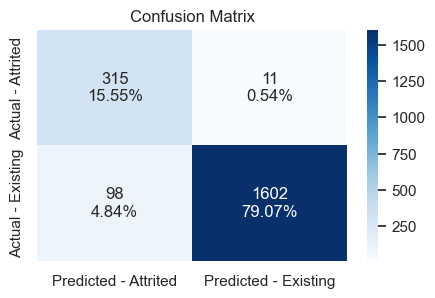

In [140]:
create_confusion_matrix(lgbm_tuned_model, X_val, y_val)

### Tuning GBM with Down Sampled data

In [141]:
model = GradientBoostingClassifier(random_state=seed)

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 50, stop = 2000, num = 10)]
max_features = ['auto', 'sqrt']
max_depth = [5, 8, 15, 25, 30]
min_samples_split = [2, 5, 10, 15, 100]
min_samples_leaf = [1, 2, 5, 10, 15] 


# Parameter grid to pass in RandomizedSearchCV
param_grid={'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf} 

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomizedSearchCV
gbm_tuned = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=10, random_state=seed, n_jobs = -1)

# Fitting parameters in RandomizedSearchCV
gbm_tuned.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(gbm_tuned.best_params_,gbm_tuned.best_score_))

Best parameters are {'n_estimators': 1566, 'min_samples_split': 100, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 30} with CV score=0.9569535030507048:


In [143]:
gbm_tuned_model = GradientBoostingClassifier(
    n_estimators=700,
    max_features=5,
    max_depth=25,
    min_samples_split=2,
    min_samples_leaf=15,
    random_state=seed,
)
# Fit the model on training data
gbm_tuned_model.fit(X_train_un, y_train_un)

GradientBoostingClassifier(max_depth=25, max_features=5, min_samples_leaf=15,
                           n_estimators=700, random_state=1)

In [144]:
gbm_tuned_model_score = compute_scores(
    gbm_tuned_model, X_train, X_val, y_train, y_val
)

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

scoring = "recall"
gbm_down_cv = cross_val_score(
    estimator=gbm_tuned_model, X=X_train_un, y=y_train_un, scoring=scoring, cv=kfold
)

create_score_model(
    "GBM Tuned with Down Sampling", gbm_tuned_model_score, gbm_down_cv.mean()
)

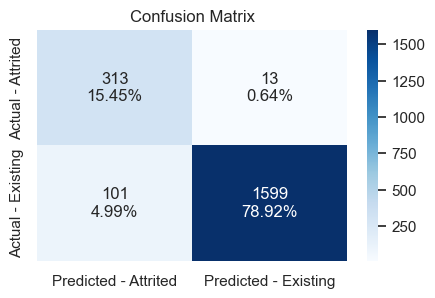

In [145]:
create_confusion_matrix(gbm_tuned_model, X_val, y_val)

## Model Comparison and Final Model Selection

In [146]:
comparison_frame = pd.DataFrame(
    {
        "Model": model_names,
        "Cross_Val_Score_Train": cross_val_train,
        "Train_Accuracy": acc_train,
        "Test_Accuracy": acc_test,
        "Train_Recall": recall_train,
        "Test_Recall": recall_test,
        "Train_Precision": precision_train,
        "Test_Precision": precision_test,
        "Train_F1": f1_train,
        "Test_F1": f1_test,
        "Train_ROC_AUC": roc_auc_train,
        "Test_ROC_AUC": roc_auc_test,
    }
)


for col in comparison_frame.select_dtypes(include="float64").columns.tolist():
    comparison_frame[col] = round(comparison_frame[col] * 100, 0).astype(int)


comparison_frame.tail(4).sort_values(
    by=["Cross_Val_Score_Train", "Test_Recall"], ascending=False
)

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
21,XGB Tuned with Down Sampling,100,83,69,100,100,74,34,85,51,98,97
23,Light GBM Tuned with Down Sampling,95,95,95,100,97,77,76,87,85,100,99
24,GBM Tuned with Down Sampling,95,96,94,100,96,79,76,88,85,100,99
22,AdaBoost Tuned with Down Sampling,94,94,94,96,96,73,74,83,84,99,99


### Test set final performance

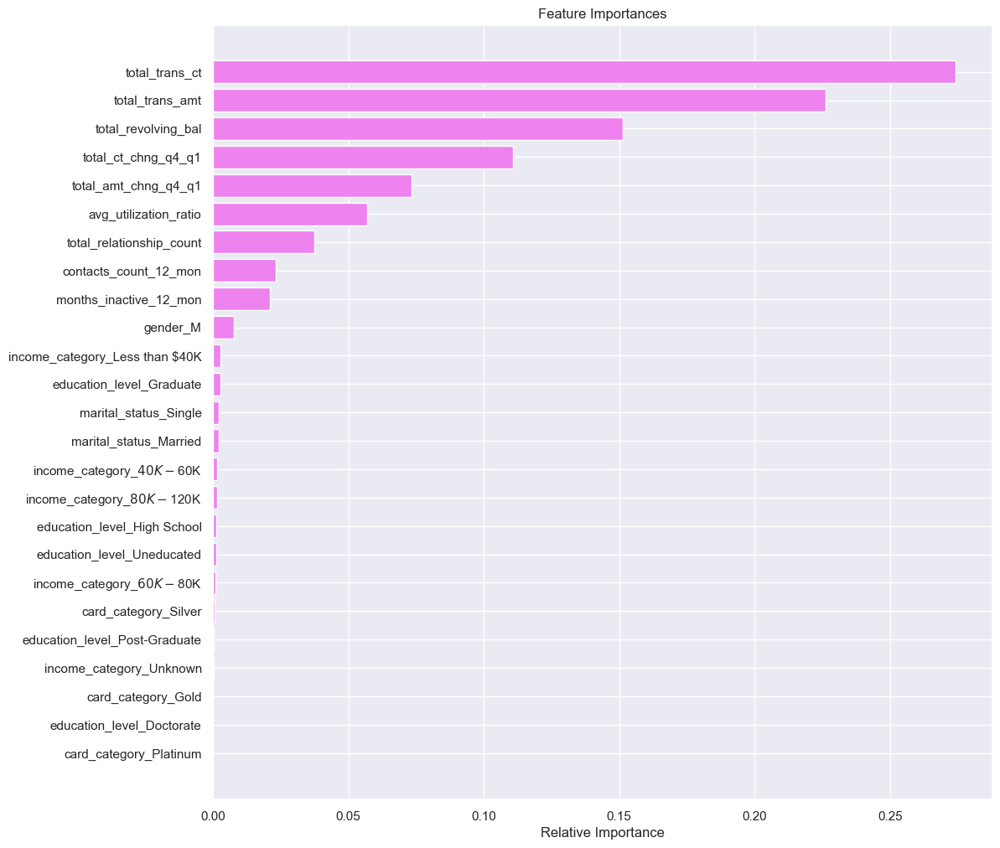

In [147]:
# Find out the feature importance
feature_names = X_train.columns
importances = gbm_tuned_model.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

In [148]:
# Model performance on test data
gbm_tuned_model_test_score = compute_scores(
    gbm_tuned_model, X_train, X_test, y_train, y_test
)

final_model_names = ["gbm Tuned Down-sampled Trained"]
final_acc_train = [gbm_tuned_model_test_score[0]]
final_acc_test = [gbm_tuned_model_test_score[1]]
final_recall_train = [gbm_tuned_model_test_score[2]]
final_recall_test = [gbm_tuned_model_test_score[3]]
final_precision_train = [gbm_tuned_model_test_score[4]]
final_precision_test = [gbm_tuned_model_test_score[5]]
final_f1_train = [gbm_tuned_model_test_score[6]]
final_f1_test = [gbm_tuned_model_test_score[7]]
final_roc_auc_train = [gbm_tuned_model_test_score[8]]
final_roc_auc_test = [gbm_tuned_model_test_score[9]]

final_result_score = pd.DataFrame(
    {
        "Model": final_model_names,
        "Train_Accuracy": final_acc_train,
        "Test_Accuracy": final_acc_test,
        "Train_Recall": final_recall_train,
        "Test_Recall": final_recall_test,
        "Train_Precision": final_precision_train,
        "Test_Precision": final_precision_test,
        "Train_F1": final_f1_train,
        "Test_F1": final_f1_test,
        "Train_ROC_AUC": final_roc_auc_train,
        "Test_ROC_AUC": final_roc_auc_test,
    }
)

for col in final_result_score.select_dtypes(include="float64").columns.tolist():
    final_result_score[col] = final_result_score[col] * 100

final_result_score

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
0,gbm Tuned Down-sampled Trained,95.605,94.669,100.000,97.231,78.520,76.145,87.968,85.405,99.834,99.231


#### Model performance with the test data is almost similar to the performance on the validation dataset.

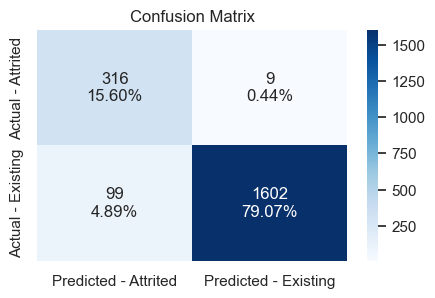

In [149]:
create_confusion_matrix(gbm_tuned_model, X_test, y_test)

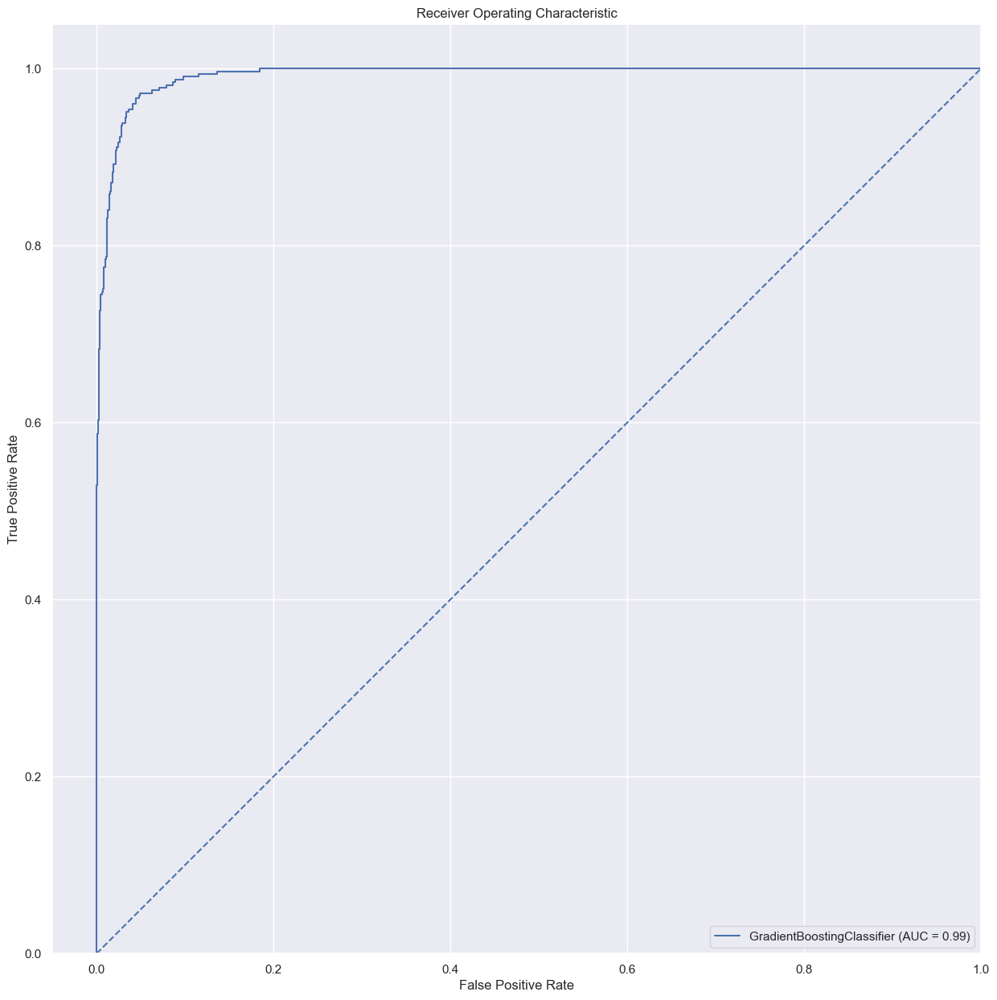

In [151]:
# Generate ROC-AUC Curve
RocCurveDisplay
RocCurveDisplay.from_estimator(gbm_tuned_model, X_test, y_test)
plt.title("Receiver Operating Characteristic")
plt.legend(loc="lower right")
plt.plot([0, 1], [0, 1], "b--")
plt.xlim([-0.05, 1])
plt.ylim([0, 1.05])
plt.ylabel("True Positive Rate")
plt.xlabel("False Positive Rate")
plt.show()

### AUC is close to 1, it looks good.

### Run the finalized model

In [155]:
seed = 1
loss_func = "logloss"

# Test and Validation sizes
test_size = 0.2
val_size = 0.25

# Dependent Varibale Value map
target_mapper = {"Attrited Customer": 1, "Existing Customer": 0}

df_pipe = data.copy()
cat_columns = df_pipe.select_dtypes(include="object").columns.tolist()
df_pipe[cat_columns] = df_pipe[cat_columns].astype("category")

In [157]:
X = df_pipe.drop(columns=["attrition_flag"])
y = df_pipe["attrition_flag"].map(target_mapper)

In [158]:
# Splitting data into training, validation and test set:
# first split into 2 parts, say temporary and test
X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=test_size, random_state=seed, stratify=y
)

# then we split the temporary set into train and validation

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=val_size, random_state=seed, stratify=y_temp
)
print(X_train.shape, X_val.shape, X_test.shape)

(6075, 19) (2026, 19) (2026, 19)


In [159]:
print(y_train.value_counts(normalize=True))
print(y_val.value_counts(normalize=True))
print(y_test.value_counts(normalize=True))

0   0.839
1   0.161
Name: attrition_flag, dtype: float64
0   0.839
1   0.161
Name: attrition_flag, dtype: float64
0   0.840
1   0.160
Name: attrition_flag, dtype: float64


In [160]:
under_sample = RandomUnderSampler(random_state=seed)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

In [163]:
columns_to_drop = [
    "credit_limit",
    "dependent_count",
    "months_on_book",
    "avg_open_to_buy",
    "customer_age",
]

# For masking a particular value in a feature
column_to_mask_value = "income_category"
value_to_mask = "abc"
masked_value = "Unknown"

# One-hot encoding columns
columns_to_encode = [
    "gender",
    "education_level",
    "marital_status",
    "income_category",
    "card_category",
]

# Numerical Columns
num_columns = [
    "total_relationship_count",
    "months_inactive_12_mon",
    "contacts_count_12_mon",
    "total_revolving_bal",
    "total_amt_chng_q4_q1",
    "total_trans_amt",
    "total_trans_ct",
    "total_ct_chng_q4_q1",
    "avg_utilization_ratio",
]

# Columns for null imputation with Unknown
columns_to_null_imp_unknown = ["education_level", "marital_status"]

In [166]:
# To Standardize feature names
feature_name_standardizer = FeatureNamesStandardizer()

# To Drop unnecessary columns
column_dropper = ColumnDropper(features=columns_to_drop)

# To Mask incorrect/meaningless value of a feature
value_masker = CustomValueMasker(
    feature=column_to_mask_value, value_to_mask=value_to_mask, masked_value=masked_value
)

# Missing value imputation
imputer = FillUnknown()

# To encode the categorical data
one_hot = OneHotEncoder(handle_unknown="ignore")

# To scale numerical columns
scaler = RobustScaler()


# creating a transformer for feature name standardization and dropping columns
cleanser = Pipeline(
    steps=[
        ("feature_name_standardizer", feature_name_standardizer),
        ("column_dropper", column_dropper),
        ("value_mask", value_masker),
        ("imputation", imputer),
    ]
)

# creating a transformer for data encoding

encode_transformer = Pipeline(steps=[("onehot", one_hot)])
num_scaler = Pipeline(steps=[("scale", scaler)])

preprocessor = ColumnTransformer(
    transformers=[
        ("encoding", encode_transformer, columns_to_encode),
        ("scaling", num_scaler, num_columns),
    ],
    remainder="passthrough",
)

# Model

gbm_tuned_model = GradientBoostingClassifier(
    n_estimators=700,
    max_features=5,
    max_depth=25,
    min_samples_split=2,
    min_samples_leaf=15,
    random_state=seed,
)

# Creating new pipeline with best parameters
model_pipe = Pipeline(
    steps=[
        ("cleanse", cleanser),
        ("preprocess", preprocessor),
        ("model", gbm_tuned_model),
    ]
)
# Fit the model on training data
model_pipe.fit(X_train_un, y_train_un)
print(
    "Accuracy on Test is: {}%".format(round(model_pipe.score(X_test, y_test) * 100, 0))
)

Accuracy on Test is: 94.0%


In [167]:
pred_train_p = model_pipe.predict_proba(X_train_un)[:, 1] > 0.5
pred_test_p = model_pipe.predict_proba(X_test)[:, 1] > 0.5

pred_train_p = np.round(pred_train_p)
pred_test_p = np.round(pred_test_p)

train_acc_p = accuracy_score(pred_train_p, y_train_un)
test_acc_p = accuracy_score(pred_test_p, y_test)

train_recall_p = recall_score(y_train_un, pred_train_p)
test_recall_p = recall_score(y_test, pred_test_p)

In [168]:
print("Recall on Test is: {}%".format(round(test_recall_p * 100, 0)))

Recall on Test is: 97.0%


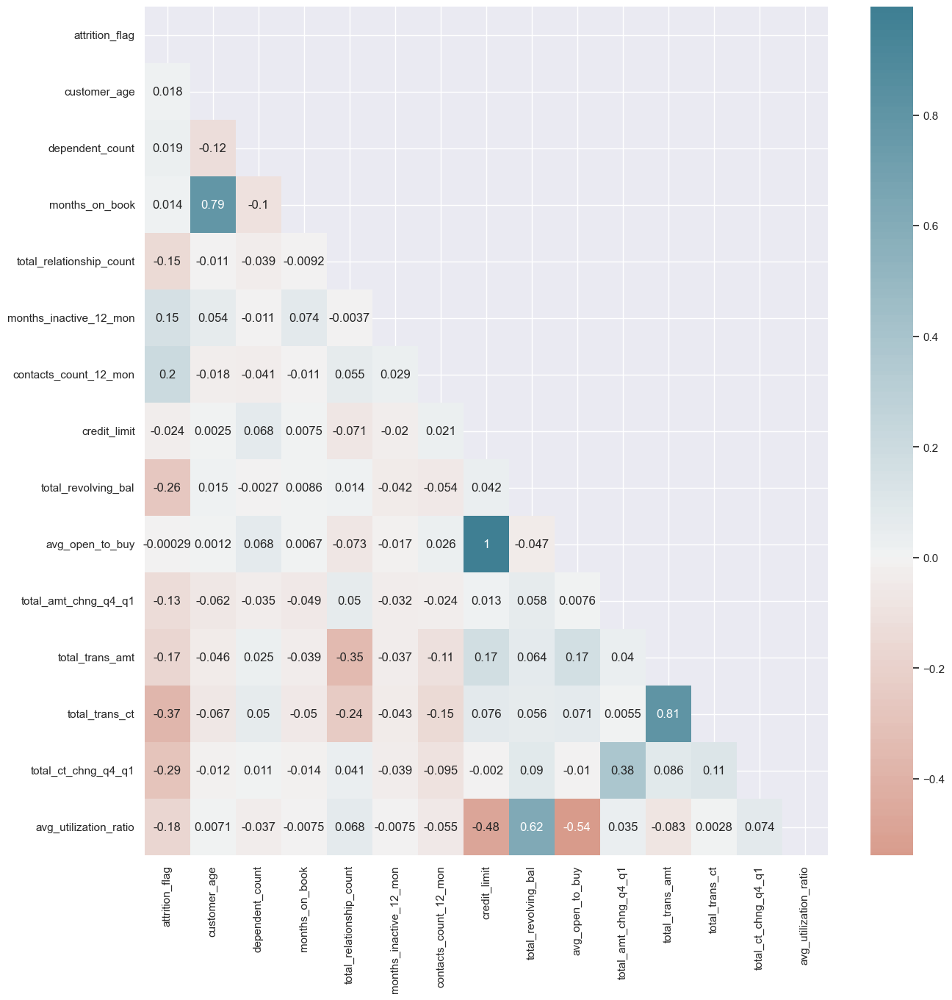

In [171]:
mask = np.zeros_like(data_clean.corr(), dtype=np.bool_)
mask[np.triu_indices_from(mask)] = True


sns.set(rc={"figure.figsize": (15, 15)})

sns.heatmap(
    data_clean.corr(),
    cmap=sns.diverging_palette(20, 220, n=200),
    annot=True,
    mask=mask,
    center=0,
)
plt.show()

# Business Insights and Conclusions

***

## Key Observations:
    1. High Positive Correlations:

        - months_on_book and customer_age: A strong positive correlation (~0.79). This suggests that older customers tend to have been with the company longer. Retention strategies for younger customers may need attention.
        - total_trans_ct and total_trans_amt: A very strong correlation (~0.81). Customers who make more transactions also tend to spend more overall, which indicates transactional engagement is tied to revenue generation.
        - avg_utilization_ratio and total_revolving_bal: A moderate to high positive correlation (~0.62). Customers with higher revolving balances (credit card debt) have a higher credit utilization ratio, which might     indicate financial stress or dependency on credit.

    2. High Negative Correlations:

       - total_trans_ct and attrition_flag: A significant negative correlation (~-0.37). Customers with more transactions are less likely to churn, suggesting that increasing transaction frequency is key to retention.
       - avg_utilization_ratio and credit_limit: A moderate negative correlation (~-0.48). Customers with higher credit limits tend to use a smaller proportion of their available credit, indicating financial stability or a lower likelihood of financial stress.

    3. Low or No Correlation:

       - Many features like contacts_count_12_mon and total_relationship_count show weak correlations with attrition_flag, suggesting they may not directly drive customer churn.


## Business Insights:
    1. Customer Retention:

        - Focus on increasing transaction counts (total_trans_ct) as it has a strong relationship with reducing churn.
        - Customers with fewer transactions may need targeted engagement campaigns such as rewards or incentives to encourage more usage.
    
    2. Target Younger Customers:

        - Since younger customers (lower customer_age) are likely to churn faster (weaker correlation with months_on_book), retention strategies like personalized offers or digital engagement might be more effective for this demographic.

    3. Credit Utilization Monitoring:

        - Customers with high avg_utilization_ratio and total_revolving_bal might be at higher risk of financial stress. Consider offering tailored financial products like debt consolidation or reduced interest rates to this segment.

    4. High Spenders & Engagement:

        - Customers with high transaction volumes (total_trans_amt and total_trans_ct) are driving significant revenue. Consider loyalty programs or exclusive benefits to ensure this group remains engaged and loyal.

    5. Low Relationship Engagement:

        - Features like total_relationship_count and contacts_count_12_mon have minimal correlation with churn, suggesting that traditional touchpoints like the number of accounts held or contact frequency might not strongly influence customer retention. Digital engagement could be a more critical factor.

## Recommendations:

    - Churn Mitigation:

        - Use predictive modeling to identify customers with low transaction counts (total_trans_ct) or high credit utilization (avg_utilization_ratio) and proactively engage them with targeted campaigns.
        
    - Upsell Opportunities:

        - High transaction customers (total_trans_ct and total_trans_amt) might be ideal for upselling premium products or services since they are already engaged and spending more.

    - Financial Wellness Initiatives:

        - Customers with high credit utilization or revolving balances could benefit from educational content on financial management or credit health, improving their long-term retention and satisfaction.
